# **Analisis Regional Super App Memahami Pola Konsumsi dan Preferensi Produk di Beberapa Provinsi Indonesia**


# TIM ORION - 16B

Nama Anggota:
1. M. Rendy Apriansyah (SC61622)
2. Rafasya Azizah G (SC61617)
3. Berlian Angga Kusuma (SC61620)
4. Tri Ayunia Patma (SC61618)
5. Wahyu Rahmadani (SC61611)
6. Hildha Meutia K. (SC61614)

# Document Notes - DATASET 1
## Bussines Understanding

Sebuah perusahaan Super App terkemuka di Indonesia, yang mengoperasikan
layanannya di seluruh provinsi, menghadapitantangan kompleks dalam mengidentifikasi
dan memahami tren serta pola penggunaan aplikasinya yang berbeda-beda di tiap
provinsi. Variasi ini muncul karena setiap provinsi memiliki karakteristik demografis dan
ekonomi yang unik, yang mempengaruhi preferensi dan kebutuhan pengguna terhadap
produk yang ditawarkan. Dalam kapasitas sebagai seorang data scientist, diberi tugas
untuk melakukan analisis data yang mendalam untuk mengurai dinamika regional yang
kompleks. Tujuan akhir dari analisis ini adalah untuk memberikan wawasan yang dapat
membantu perusahaan beroperasi lebih efektif dan efisien, serta menyusun strategi
yang tepat guna menanggapi kebutuhan pasar yang dinamis dan beragam.

## Data Understanding

*   user.csv: Berisi informasi terperinci mengenai pengguna, meliputi data
demografis dan riwayat transaksi yang membantu memahami perilaku pengguna.
*   location_reference.csv: Menyediakan rinci lokasi geografis yang penting untuk analisis regional.
*   product_reference.csv: Menawarkan gambaran lengkap tentang jajaran
produk, yang vital untuk menghubungkan preferensi regional dengan tawaran
spesifik.
*   level_trx.csv: Catatan historis transaksi yang mendetail memungkinkan analisis tren pembelian dan pengaruh promosi.


#  Importing Package & Load Semua Dataset


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
from sklearn.preprocessing import StandardScaler
plt.style.use('fivethirtyeight')
pd.set_option('display.float_format', '{:.2f}'.format)
pd.set_option('display.max_columns', None)
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from prophet.plot import plot_plotly, plot_components_plotly
from sklearn.metrics import mean_absolute_error,mean_absolute_percentage_error, mean_squared_error
import itertools

In [ ]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from mpl_toolkits.mplot3d import Axes3D
from sklearn.neighbors import NearestNeighbors

Cell di atas melakukan proses impor dan memuat paket yang akan digunakan selama pengerjaan di Google Colab.

# **Data Preparation**

## Dataset User

In [ ]:
user = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/user.csv')
user

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth
0,SC7502062007001,PRIYANTI FIORI,perempuan,2270000.00,130000.00,480000.00,2023-11-05,1984-07-25
1,SC7502062007002,KURNIA MUHAMAD WANIMBO,laki-laki,2370000.00,140000.00,500000.00,2023-12-27,1991-02-12
2,SC7502062007003,AJENG LESTARI,perempuan,0.00,0.00,0.00,2024-07-19,1982-06-18
3,SC7502062007004,TIA IRIANI S.E.,perempuan,0.00,0.00,0.00,2024-05-24,1972-09-27
4,SC7502062006001,ANCE,perempuan,0.00,0.00,0.00,2024-11-25,1992-06-11
...,...,...,...,...,...,...,...,...
427481,SC1212102018001,ACHMAD,laki-laki,1040000.00,60000.00,360000.00,2023-10-14,1982-10-20
427482,SC1212102018004,AJIE AHMAD Masykur,laki-laki,1510000.00,60000.00,550000.00,2023-12-04,1997-08-03
427483,SC1212102008001,WIWIN WAHYUNI,perempuan,2120000.00,100000.00,800000.00,2023-12-10,1978-12-17
427484,SC1212102010001,NYIMAS,perempuan,1700000.00,50000.00,490000.00,2023-10-18,1993-04-04


Import dataset User

In [ ]:
user.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 427486 entries, 0 to 427485
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              427486 non-null  object 
 1   full_name       427486 non-null  object 
 2   gender          427486 non-null  object 
 3   money_spent     427484 non-null  float64
 4   refund          427484 non-null  float64
 5   wallet_balance  427484 non-null  float64
 6   join_date       427486 non-null  object 
 7   birth           427486 non-null  object 
dtypes: float64(3), object(5)
memory usage: 26.1+ MB


### Pengecekan Missing Values Dataset User

In [ ]:
total_rows = user.shape[0]

missing_values = user.isna().sum()

jumlah_missing = (missing_values/total_rows) * 100

jumlah_missing

id               0.00
full_name        0.00
gender           0.00
money_spent      0.00
refund           0.00
wallet_balance   0.00
join_date        0.00
birth            0.00
dtype: float64

In [ ]:
user = user.dropna()

In [ ]:
negative_money = user[(user['money_spent'] < 0) | (user['refund'] < 0) | (user['wallet_balance'] < 0)]

negative_money.shape[0]

5600

In [ ]:
negative_money_indices = user[(user['money_spent'] < 0) | (user['refund'] < 0) | (user['wallet_balance'] < 0)].index

user.drop(negative_money_indices, inplace=True)

<ipython-input-9-9b58bec1ee91>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user.drop(negative_money_indices, inplace=True)


In [ ]:
indices_to_drop = user[user['refund'] > user['money_spent']].index

user.drop(indices_to_drop, inplace=True)

<ipython-input-10-1593369203c1>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user.drop(indices_to_drop, inplace=True)


Proses pengecekan missing value dari dataset user dan dilakukan handling pada dataset apabila ditemukan missing value ataupun anomali data.

In [ ]:
user.duplicated().sum()

0

Pengecekan duplicated value dan tidak ditemukan maka proses dilanjutkan

In [ ]:
user.info()

<class 'pandas.core.frame.DataFrame'>
Index: 420935 entries, 0 to 427485
Data columns (total 8 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   id              420935 non-null  object 
 1   full_name       420935 non-null  object 
 2   gender          420935 non-null  object 
 3   money_spent     420935 non-null  float64
 4   refund          420935 non-null  float64
 5   wallet_balance  420935 non-null  float64
 6   join_date       420935 non-null  object 
 7   birth           420935 non-null  object 
dtypes: float64(3), object(5)
memory usage: 28.9+ MB


In [ ]:
user.describe()

,money_spent,refund,wallet_balance
count,420935.00,420935.00,420935.00
mean,1808601.38,175378.15,639136.73
std,480621.52,136959.24,2959733.54
min,0.00,0.00,0.00
25%,1610000.00,80000.00,430000.00
50%,1870000.00,160000.00,600000.00
75%,2090000.00,240000.00,770000.00
max,22730000.00,7270000.00,1280390000.00


## Dataset Lokasi

In [ ]:
location = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/location_reference.csv')
location

,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan,kode kecamatan
0,GORONTALO,75,BOALEMO,7502,BOTUMOITO,750206
1,GORONTALO,75,BOALEMO,7502,DULUPI,750203
2,GORONTALO,75,BOALEMO,7502,MANANGGU,750205
3,GORONTALO,75,BOALEMO,7502,PAGUYAMAN,750201
4,GORONTALO,75,BOALEMO,7502,PAGUYAMAN PANTAI,750207
...,...,...,...,...,...,...
7402,SUMATERA UTARA,12,TOBA,1212,SIANTAR NARUMONDA,121220
7403,SUMATERA UTARA,12,TOBA,1212,SIGUMPAR,121219
7404,SUMATERA UTARA,12,TOBA,1212,SILAEN,121203
7405,SUMATERA UTARA,12,TOBA,1212,TAMPAHAN,121222


In [ ]:
location.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7407 entries, 0 to 7406
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   nama provinsi   7407 non-null   object
 1   kode provinsi   7407 non-null   int64 
 2   nama kabupaten  7407 non-null   object
 3   kode kabupaten  7407 non-null   object
 4   nama kecamatan  7407 non-null   object
 5   kode kecamatan  7407 non-null   object
dtypes: int64(1), object(5)
memory usage: 347.3+ KB


### Pengecekan Missing Values Dataset Location

In [ ]:
location.isnull().sum()

nama provinsi     0
kode provinsi     0
nama kabupaten    0
kode kabupaten    0
nama kecamatan    0
kode kecamatan    0
dtype: int64

## Dataset Product

In [ ]:
url = 'https://docs.google.com/spreadsheets/d/1uq8rtK7UsFQsbzFOJeCUr9XVL1phn_WRT5s7Ds6aoxw/export?format=xlsx'
produk = pd.read_excel(url)
produk

,id,product name
0,1,Man Fashion
1,2,Woman Fashion
2,3,Food & Drink
3,4,Ride Hailing
4,5,Keperluan Rumah Tangga
5,6,Travel
6,7,Keperluan Anak
7,8,Elektronik
8,9,Other
9,10,Transportasi (Kereta Pesawat Kapal)


In [ ]:
produk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18 entries, 0 to 17
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            18 non-null     int64 
 1   product name  18 non-null     object
dtypes: int64(1), object(1)
memory usage: 416.0+ bytes


In [ ]:
produk.isnull().sum()

id              0
product name    0
dtype: int64

## Level 1

In [ ]:
level_1 = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/33_processed.csv')
level_1

,id,user_id,product_id,gross_amount,discounts,transaction_date
0,TRX679679,SC3304092002002,1,24500.00,NaN,2024-11-08
1,TRX679680,SC3304092002002,1,68800.00,NaN,2024-04-11
2,TRX679681,SC3304092002002,1,26700.00,26700.00,2024-07-01
3,TRX679682,SC3304092002002,2,27100.00,NaN,2024-02-07
4,TRX679683,SC3304092002002,2,78300.00,NaN,2024-03-12
...,...,...,...,...,...,...
2103788,TRX2783467,SC3307091021022,15,6500.00,NaN,2024-07-06
2103789,TRX2783468,SC3307091021022,15,49000.00,28300.00,2024-09-27
2103790,TRX2783469,SC3307091021022,15,34300.00,21700.00,2024-07-21
2103791,TRX2783470,SC3307091021022,16,15800.00,NaN,2024-07-13


Proses impor dataset transaction dilakukan per level untuk data preparation yang berbeda pada masing-masing level.

In [ ]:
level_1.describe()

,product_id,gross_amount,discounts
count,2103793.00,2091854.00,668347.00
mean,8.08,58183.42,32346.65
std,5.54,97952.62,43897.07
min,1.00,-100.00,-100.00
25%,3.00,6700.00,8700.00
50%,7.00,21700.00,18700.00
75%,14.00,66400.00,40000.00
max,18.00,2622800.00,1571300.00


Pengecekan statistical five summaries pada fitur numerik untuk dataset level 1.

### Pengecekan Missing Value Level 1

In [ ]:
level_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2103793 entries, 0 to 2103792
Data columns (total 6 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id                object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 96.3+ MB


In [ ]:
level_1.isnull().sum()

id                        0
user_id                   0
product_id                0
gross_amount          11939
discounts           1435446
transaction_date          0
dtype: int64

In [ ]:
level_1.nunique()

id                  2103793
user_id               69114
product_id               18
gross_amount          23997
discounts             13718
transaction_date        366
dtype: int64

In [ ]:
level_1['discounts'] = level_1['discounts'].fillna(0.00)
level_1.isnull().sum()

id                      0
user_id                 0
product_id              0
gross_amount        11939
discounts               0
transaction_date        0
dtype: int64

In [ ]:
result1 = level_1.loc[level_1['gross_amount'] < 0 ]
result1

,id,user_id,product_id,gross_amount,discounts,transaction_date
23475,TRX703154,SC3304032001016,17,-100.00,-100.00,2024-04-16
33282,TRX712961,SC3304192008003,5,-0.00,-0.00,2024-07-03
47650,TRX727329,SC3304042002002,18,-0.00,-0.00,2024-04-29
78550,TRX758229,SC3302172010016,6,-0.00,-0.00,2024-09-03
83459,TRX763138,SC3302172004013,4,-0.00,-0.00,2024-06-29
...,...,...,...,...,...,...
2002078,TRX2681757,SC3312072008007,18,-0.00,-0.00,2024-02-04
2050032,TRX2729711,SC3312192012012,17,-0.00,-0.00,2024-02-22
2050994,TRX2730673,SC3312192006007,9,-0.00,-0.00,2024-05-16
2061050,TRX2740729,SC3307122014004,7,-0.00,-0.00,2024-09-12


In [ ]:
level_1[['gross_amount','discounts']] = level_1[['gross_amount','discounts']].replace(-0.00, 0.00)

In [ ]:
level_1 = level_1.dropna()
level_1 = level_1.drop(level_1[level_1['gross_amount'] < 0].index)

In [ ]:
level_1.isnull().sum()

id                  0
user_id             0
product_id          0
gross_amount        0
discounts           0
transaction_date    0
dtype: int64

Di sini dilakukan proses pengecekan missing value dan data yang tidak biasa dari fitur gross amount dan discount. Untuk fitur gross amount, apabila ditemukan missing value, data tersebut akan dihapus. Sedangkan untuk fitur discount, nilai missing value akan diimputasi dengan nilai '0'. Keputusan penghapusan missing value pada features gross amount dilakukan karena jumlah missing valuenya sangat kecil dan tidak akan mempengaruhi keseluruhan dataset.

### Pengecekan Duplicate Values Level 1

In [ ]:
distinct_count = len(level_1.drop_duplicates())
duplicate_count = len(level_1) - distinct_count
f'{distinct_count} distinct rows and {duplicate_count} duplicated rows'

'2091698 distinct rows and 0 duplicated rows'

Untuk duplicate value pada dataset transaction, tidak ada nilai yang duplikat sehingga hanya dilakukan pengecekan saja tanpa perlu penanganan lebih lanjut.

## Level 2

In [ ]:
level_2 = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/74_processed.csv')
level_2

,id,user_id,product_id,gross_amount,discounts,transaction_date
0,TRX456915,SC7406052010001,1,31900.00,NaN,2024-10-29
1,TRX456916,SC7406052010001,1,53600.00,NaN,2024-12-12
2,TRX456917,SC7406052010001,1,74500.00,NaN,2024-07-15
3,TRX456918,SC7406052010001,2,800.00,NaN,2024-11-05
4,TRX456919,SC7406052010001,2,9200.00,NaN,2024-03-11
...,...,...,...,...,...,...
180912,TRX637827,SC7407012031002,14,3200.00,NaN,2024-06-04
180913,TRX637828,SC7407012031002,14,1600.00,NaN,2024-04-15
180914,TRX637829,SC7407012031002,14,55200.00,NaN,2024-02-11
180915,TRX637830,SC7407012031002,15,6400.00,NaN,2024-11-04


Proses impor dataset transaction dilakukan per level untuk data preparation yang berbeda pada masing-masing level.

In [ ]:
level_2.describe()

,product_id,gross_amount,discounts
count,180917.00,180080.00,36606.00
mean,8.32,49158.98,14916.43
std,5.21,82059.40,17527.82
min,1.00,-100.00,-100.00
25%,4.00,5700.00,6000.00
50%,8.00,18700.00,10000.00
75%,13.00,57200.00,20000.00
max,18.00,1916500.00,580000.00


Pengecekan statistical five summaries pada fitur numerik untuk dataset level 2.

### Pengecekan Missing Value Level 2

In [ ]:
level_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180917 entries, 0 to 180916
Data columns (total 6 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   id                180917 non-null  object 
 1   user_id           180917 non-null  object 
 2   product_id        180917 non-null  int64  
 3   gross_amount      180080 non-null  float64
 4   discounts         36606 non-null   float64
 5   transaction_date  180917 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 8.3+ MB


In [ ]:
level_2.isnull().sum()

id                       0
user_id                  0
product_id               0
gross_amount           837
discounts           144311
transaction_date         0
dtype: int64

In [ ]:
level_2.nunique()

id                  180917
user_id               4964
product_id              18
gross_amount          8900
discounts             2083
transaction_date       366
dtype: int64

In [ ]:
level_2['discounts'] = level_2['discounts'].fillna(0.00)
level_2.isnull().sum()

id                    0
user_id               0
product_id            0
gross_amount        837
discounts             0
transaction_date      0
dtype: int64

In [ ]:
result2 = level_2.loc[level_2['gross_amount'] < 0 ]
result2

,id,user_id,product_id,gross_amount,discounts,transaction_date
13707,TRX470622,SC7404232010001,15,-0.00,-0.00,2024-04-21
14361,TRX471276,SC7404232008002,13,-0.00,-0.00,2024-01-26
17552,TRX474467,SC7404111026002,13,-0.00,-0.00,2024-03-12
21009,TRX477924,SC7404111006003,10,-0.00,-0.00,2024-10-21
23676,TRX480591,SC7404292006001,1,-0.00,-0.00,2024-09-10
62158,TRX519073,SC7401102010003,6,-0.00,-0.00,2024-05-28
68365,TRX525280,SC7411052005003,12,-0.00,-0.00,2024-07-13
74086,TRX531001,SC7411082018001,18,-0.00,-0.00,2024-05-20
74708,TRX531623,SC7408032015001,12,-0.00,-0.00,2024-09-02
84063,TRX540978,SC7408112001002,10,-0.00,-0.00,2024-03-25


In [ ]:
level_2[['gross_amount','discounts']] = level_2[['gross_amount','discounts']].replace(-0.00, 0.00)

In [ ]:
level_2 = level_2.dropna()
level_2 = level_2.drop(level_2[level_2['gross_amount'] < 0].index)

In [ ]:
level_2.isnull().sum()

id                  0
user_id             0
product_id          0
gross_amount        0
discounts           0
transaction_date    0
dtype: int64

Di sini dilakukan proses pengecekan missing value dan data yang tidak biasa dari fitur gross amount dan discount. Untuk fitur gross amount, apabila ditemukan missing value, data tersebut akan dihapus. Sedangkan untuk fitur discount, nilai missing value akan diimputasi dengan nilai '0'. Keputusan penghapusan missing value pada features gross amount dilakukan karena jumlah missing valuenya sangat kecil dan tidak akan mempengaruhi keseluruhan dataset.

### Pengecekan Duplicate values Level 2

In [ ]:
distinct_count = len(level_2.drop_duplicates())
duplicate_count = len(level_2) - distinct_count
f'{distinct_count} distinct rows and {duplicate_count} duplicated rows'

'180065 distinct rows and 0 duplicated rows'

Untuk duplicate value pada dataset transaction, tidak ada nilai yang duplikat sehingga hanya dilakukan pengecekan saja tanpa perlu penanganan lebih lanjut.

## Level 3

In [ ]:
level_3 = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/75_processed.csv')
level_3

,id,user_id,product_id,gross_amount,discounts,transaction_date
0,TRX478897,SC7502062007001,1,7400.00,NaN,2024-11-07
1,TRX478898,SC7502062007001,1,24500.00,NaN,2024-01-25
2,TRX478899,SC7502062007001,1,28100.00,20000.00,2024-10-28
3,TRX478900,SC7502062007001,2,137000.00,NaN,2024-07-23
4,TRX478901,SC7502062007001,2,14700.00,NaN,2024-06-28
...,...,...,...,...,...,...
87097,TRX565994,SC7504112006002,14,2100.00,NaN,2024-02-03
87098,TRX565995,SC7504112006002,14,6300.00,NaN,2024-09-06
87099,TRX565996,SC7504112006002,17,25900.00,NaN,2024-01-30
87100,TRX565997,SC7504112006002,17,44700.00,NaN,2024-10-13


Proses impor dataset transaction dilakukan per level untuk data preparation yang berbeda pada masing-masing level.

In [ ]:
level_3.describe()

,product_id,gross_amount,discounts
count,87102.00,86744.00,22553.00
mean,8.12,64624.07,21113.77
std,5.32,112095.40,22823.83
min,1.00,-100.00,-100.00
25%,3.00,5000.00,7400.00
50%,7.00,16300.00,12200.00
75%,13.00,72700.00,29600.00
max,18.00,1727300.00,518900.00


Pengecekan statistical five summaries pada fitur numerik untuk dataset level 3.

### Pengecekan Missing Value Level 3

In [ ]:
level_3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87102 entries, 0 to 87101
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                87102 non-null  object 
 1   user_id           87102 non-null  object 
 2   product_id        87102 non-null  int64  
 3   gross_amount      86744 non-null  float64
 4   discounts         22553 non-null  float64
 5   transaction_date  87102 non-null  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 4.0+ MB


In [ ]:
level_3.isnull().sum()

id                      0
user_id                 0
product_id              0
gross_amount          358
discounts           64549
transaction_date        0
dtype: int64

In [ ]:
level_3.nunique()

id                  87102
user_id              2714
product_id             18
gross_amount         7769
discounts            1833
transaction_date      366
dtype: int64

In [ ]:
level_3['discounts'] = level_3['discounts'].fillna(0.00)
level_3.isnull().sum()

id                    0
user_id               0
product_id            0
gross_amount        358
discounts             0
transaction_date      0
dtype: int64

In [ ]:
result3 = level_3.loc[level_3['gross_amount'] < 0 ]
result3

,id,user_id,product_id,gross_amount,discounts,transaction_date
19389,TRX498286,SC7503032023003,6,-0.00,-0.00,2024-04-26
26877,TRX505774,SC7501052006004,13,-100.00,-100.00,2024-02-10
31521,TRX510418,SC7501112011002,9,-0.00,-0.00,2024-12-04
36984,TRX515881,SC7501011002003,10,-0.00,-0.00,2024-05-08
47845,TRX526742,SC7501042009004,10,-0.00,-0.00,2024-11-22
48696,TRX527593,SC7501182006006,7,-100.00,-100.00,2024-02-05
67183,TRX546080,SC7571091003003,11,-0.00,-0.00,2024-04-20
72345,TRX551242,SC7571061004008,13,-0.00,-0.00,2024-07-21


In [ ]:
level_3[['gross_amount','discounts']] = level_3[['gross_amount','discounts']].replace(-0.00, 0.00)

In [ ]:
level_3 = level_3.dropna()
level_3 = level_3.drop(level_3[level_3['gross_amount'] < 0].index)

In [ ]:
level_3.isnull().sum()

id                  0
user_id             0
product_id          0
gross_amount        0
discounts           0
transaction_date    0
dtype: int64

Di sini dilakukan proses pengecekan missing value dan data yang tidak biasa dari fitur gross amount dan discount. Untuk fitur gross amount, apabila ditemukan missing value, data tersebut akan dihapus. Sedangkan untuk fitur discount, nilai missing value akan diimputasi dengan nilai '0'. Keputusan penghapusan missing value pada features gross amount dilakukan karena jumlah missing valuenya sangat kecil dan tidak akan mempengaruhi keseluruhan dataset.

### Pengecekan Duplicate Values Level 3

In [ ]:
distinct_count = len(level_3.drop_duplicates())
duplicate_count = len(level_3) - distinct_count
f'{distinct_count} distinct rows and {duplicate_count} duplicated rows'

'86736 distinct rows and 0 duplicated rows'

Untuk duplicate value pada dataset transaction, tidak ada nilai yang duplikat sehingga hanya dilakukan pengecekan saja tanpa perlu penanganan lebih lanjut.

## Level 4

In [ ]:
level_4 = pd.read_csv('/content/drive/MyDrive/Tim 16B Final Project Drive/Dataset/Sebelum dibersihkan/94_processed.csv')
level_4

,id,user_id,product_id,gross_amount,discounts,transaction_date
0,TRX722042,SC9404152007902,1,41700.00,NaN,2024-05-24
1,TRX722043,SC9404152007902,1,9300.00,NaN,2024-04-11
2,TRX722044,SC9404152007902,1,27100.00,27100.00,2024-05-08
3,TRX722045,SC9404152007902,1,41900.00,12900.00,2024-05-17
4,TRX722046,SC9404152007902,2,68200.00,NaN,2024-01-13
...,...,...,...,...,...,...
3060,TRX725102,SC9401052001003,16,75000.00,10000.00,2024-04-12
3061,TRX725103,SC9401052001003,17,16200.00,NaN,2024-01-07
3062,TRX725104,SC9401052001003,17,83800.00,NaN,2024-10-14
3063,TRX725105,SC9401052001003,18,57800.00,NaN,2024-02-22


Proses impor dataset transaction dilakukan per level untuk data preparation yang berbeda pada masing-masing level.

In [ ]:
level_4.describe()

,product_id,gross_amount,discounts
count,3065.00,3057.00,808.00
mean,9.00,52463.20,27551.73
std,5.18,98170.78,41110.97
min,1.00,100.00,200.00
25%,4.00,6900.00,6700.00
50%,9.00,17700.00,12900.00
75%,14.00,52800.00,30000.00
max,18.00,1824500.00,510000.00


Pengecekan statistical five summaries pada fitur numerik untuk dataset level 4.

### Pengecekan Missing Value Level 4

In [ ]:
level_4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3065 entries, 0 to 3064
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                3065 non-null   object 
 1   user_id           3065 non-null   object 
 2   product_id        3065 non-null   int64  
 3   gross_amount      3057 non-null   float64
 4   discounts         808 non-null    float64
 5   transaction_date  3065 non-null   object 
dtypes: float64(2), int64(1), object(3)
memory usage: 143.8+ KB


In [ ]:
level_4.isnull().sum()

id                     0
user_id                0
product_id             0
gross_amount           8
discounts           2257
transaction_date       0
dtype: int64

In [ ]:
level_4.nunique()

id                  3065
user_id               68
product_id            18
gross_amount        1227
discounts            352
transaction_date     366
dtype: int64

In [ ]:
level_4['discounts'] = level_4['discounts'].fillna(0.00)
level_4.isnull().sum()

id                  0
user_id             0
product_id          0
gross_amount        8
discounts           0
transaction_date    0
dtype: int64

In [ ]:
result4 = level_4.loc[level_4['gross_amount'] < 0 ]
result4

,id,user_id,product_id,gross_amount,discounts,transaction_date


In [ ]:
level_4[['gross_amount','discounts']] = level_4[['gross_amount','discounts']].replace(-0.00, 0.00)

In [ ]:
level_4 = level_4.dropna()
level_4 = level_4.drop(level_4[level_4['gross_amount'] < 0].index)

In [ ]:
level_4.isnull().sum()

id                  0
user_id             0
product_id          0
gross_amount        0
discounts           0
transaction_date    0
dtype: int64

Di sini dilakukan proses pengecekan missing value dan data yang tidak biasa dari fitur gross amount dan discount. Untuk fitur gross amount, apabila ditemukan missing value, data tersebut akan dihapus. Sedangkan untuk fitur discount, nilai missing value akan diimputasi dengan nilai '0'. Keputusan penghapusan missing value pada features gross amount dilakukan karena jumlah missing valuenya sangat kecil dan tidak akan mempengaruhi keseluruhan dataset.

### Pengecekan Duplicate Values Level 4

In [ ]:
distinct_count = len(level_4.drop_duplicates())
duplicate_count = len(level_4) - distinct_count
f'{distinct_count} distinct rows and {duplicate_count} duplicated rows'

'3057 distinct rows and 0 duplicated rows'

Untuk duplicate value pada dataset transaction, tidak ada nilai yang duplikat sehingga hanya dilakukan pengecekan saja tanpa perlu penanganan lebih lanjut.

## Penggabungan Semua Dataset

### Merging Level & Product

In [ ]:
level_merged = pd.concat([level_1, level_2, level_3, level_4], ignore_index=True)

In [ ]:
level_merged.describe()

,product_id,gross_amount,discounts
count,2361556.00,2361556.00,2361556.00
mean,8.09,57728.85,9596.75
std,5.50,97435.90,27706.46
min,1.00,0.00,0.00
25%,3.00,6500.00,0.00
50%,7.00,21300.00,0.00
75%,14.00,65800.00,6500.00
max,18.00,2622800.00,1571300.00


In [ ]:
level_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2361556 entries, 0 to 2361555
Data columns (total 6 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id                object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
dtypes: float64(2), int64(1), object(3)
memory usage: 108.1+ MB


In [ ]:
level_product_merged = pd.merge(level_merged, produk, left_on='product_id', right_on='id', how='left', suffixes=('', '_produk'))
level_product_merged.drop('id_produk', axis=1, inplace=True)

In [ ]:
level_product_merged.head(5)

,id,user_id,product_id,gross_amount,discounts,transaction_date,product name
0,TRX679679,SC3304092002002,1,24500.00,0.00,2024-11-08,Man Fashion
1,TRX679680,SC3304092002002,1,68800.00,0.00,2024-04-11,Man Fashion
2,TRX679681,SC3304092002002,1,26700.00,26700.00,2024-07-01,Man Fashion
3,TRX679682,SC3304092002002,2,27100.00,0.00,2024-02-07,Woman Fashion
4,TRX679683,SC3304092002002,2,78300.00,0.00,2024-03-12,Woman Fashion


In [ ]:
level_product_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2361556 entries, 0 to 2361555
Data columns (total 7 columns):
 #   Column            Dtype  
---  ------            -----  
 0   id                object 
 1   user_id           object 
 2   product_id        int64  
 3   gross_amount      float64
 4   discounts         float64
 5   transaction_date  object 
 6   product name      object 
dtypes: float64(2), int64(1), object(4)
memory usage: 126.1+ MB


### Merging User & Location

In [ ]:
user = user[user['id'].isin(level_merged['user_id'])]
user.info()

<class 'pandas.core.frame.DataFrame'>
Index: 76155 entries, 0 to 337041
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              76155 non-null  object 
 1   full_name       76155 non-null  object 
 2   gender          76155 non-null  object 
 3   money_spent     76155 non-null  float64
 4   refund          76155 non-null  float64
 5   wallet_balance  76155 non-null  float64
 6   join_date       76155 non-null  object 
 7   birth           76155 non-null  object 
dtypes: float64(3), object(5)
memory usage: 5.2+ MB


In [ ]:
user['kode kecamatan'] = user['id'].astype(str).str[2:8]

user_location_merged = pd.merge(user, location, on='kode kecamatan', how='left')

user_location_merged.drop('kode kecamatan', axis=1, inplace=True)

user_location_merged.head()

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan
0,SC7502062007001,PRIYANTI FIORI,perempuan,2270000.00,130000.00,480000.00,2023-11-05,1984-07-25,GORONTALO,75,BOALEMO,7502,BOTUMOITO
1,SC7502062007002,KURNIA MUHAMAD WANIMBO,laki-laki,2370000.00,140000.00,500000.00,2023-12-27,1991-02-12,GORONTALO,75,BOALEMO,7502,BOTUMOITO
2,SC7502062002001,Charlotte NURHALIMAH,perempuan,2330000.00,100000.00,310000.00,2023-12-17,1986-10-21,GORONTALO,75,BOALEMO,7502,BOTUMOITO
3,SC7502062002002,Hj. OLVAH,perempuan,2310000.00,150000.00,370000.00,2023-10-21,2007-10-08,GORONTALO,75,BOALEMO,7502,BOTUMOITO
4,SC7502062002003,HARAHAP ROHMAN S.Pd.,laki-laki,2530000.00,50000.00,310000.00,2023-10-18,2007-03-27,GORONTALO,75,BOALEMO,7502,BOTUMOITO


In [ ]:
user_location_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76155 entries, 0 to 76154
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              76155 non-null  object 
 1   full_name       76155 non-null  object 
 2   gender          76155 non-null  object 
 3   money_spent     76155 non-null  float64
 4   refund          76155 non-null  float64
 5   wallet_balance  76155 non-null  float64
 6   join_date       76155 non-null  object 
 7   birth           76155 non-null  object 
 8   nama provinsi   76155 non-null  object 
 9   kode provinsi   76155 non-null  int64  
 10  nama kabupaten  76155 non-null  object 
 11  kode kabupaten  76155 non-null  object 
 12  nama kecamatan  76155 non-null  object 
dtypes: float64(3), int64(1), object(9)
memory usage: 7.6+ MB


## Pengecekan Outlier

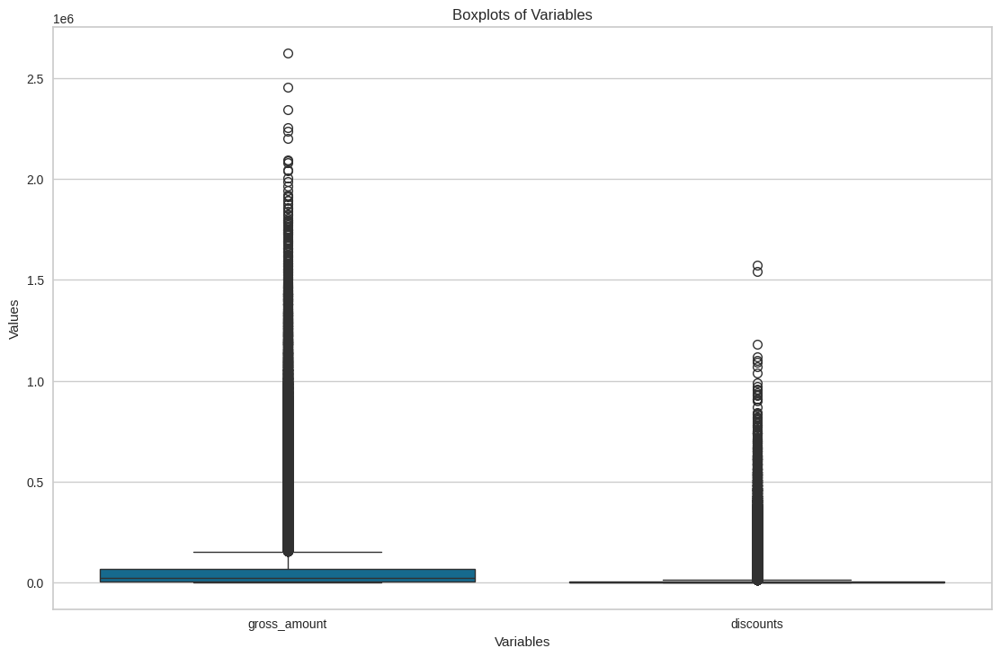

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=level_product_merged[['gross_amount','discounts']])

plt.title('Boxplots of Variables')
plt.xlabel('Variables')
plt.ylabel('Values')

plt.show()

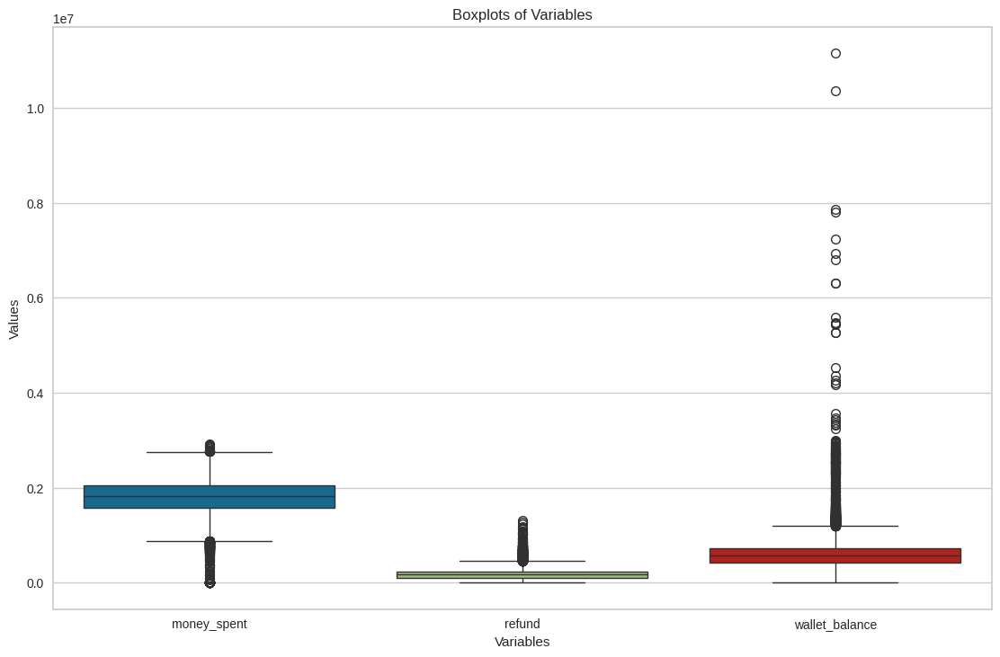

In [ ]:
plt.figure(figsize=(12, 8))
sns.boxplot(data=user_location_merged[['money_spent','refund', 'wallet_balance']])

plt.title('Boxplots of Variables')
plt.xlabel('Variables')
plt.ylabel('Values')

plt.show()

Di sini dilakukan pengecekan outlier pada fitur numerik untuk dataset yang telah digabungkan sebelumnya. Tidak dilakukan penanganan pada nilai-nilai outlier yang ada karena outlier dapat memberikan informasi berharga tentang kondisi luar biasa atau kejadian tidak biasa yang perlu diperhatikan. Menghapus outlier dapat menghilangkan informasi penting ini dari analisis.

# **EDA**

## Gender Distribution

([<matplotlib.patches.Wedge at 0x7a699c52cc40>,
 [Text(-0.8540960779120287, 0.6931954195573498, 'perempuan'),
  Text(0.931741105102239, -0.7562132722075556, 'laki-laki')],
 [Text(-0.4658705879520156, 0.37810659248582706, '78%'),
  Text(0.5435156446429726, -0.4411244087877408, '22%')])

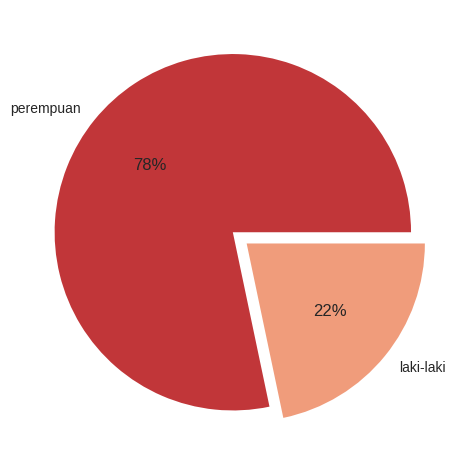

In [ ]:
explode = [0, 0.1]

gender_counts = user_location_merged['gender'].value_counts()

palette_color = sns.color_palette('RdBu')

plt.pie(gender_counts, labels=gender_counts.index, colors=palette_color,
        explode=explode, autopct='%.0f%%')

Kode diatas membuat diagram pie untuk menunjukkan distribusi gender dalam dataset. Diagram menunjukkan bahwa 78% adalah perempuan dan 22% adalah laki-laki, dengan potongan untuk laki-laki dibuat sedikit terpisah (explode) untuk penekanan.

## 10 Orang dengan pengeluaran terbanyak

In [ ]:
top_10_money_spent = user_location_merged.nlargest(10, 'money_spent')

top_10_money_spent

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan
2703,SC9401011002025,SYAHRUL,laki-laki,2920000.00,30000.00,80000.00,2023-12-05,1995-11-25,PAPUA TENGAH,94,NABIRE,9401,NABIRE
2744,SC9401052001003,"MUHAMAD S.E., M.M.",laki-laki,2910000.00,150000.00,60000.00,2023-12-10,1995-01-06,PAPUA TENGAH,94,NABIRE,9401,WANGGAR
2705,SC9401012011001,PATTIMURA S.E.,laki-laki,2880000.00,0.00,0.00,2023-12-16,2007-07-01,PAPUA TENGAH,94,NABIRE,9401,NABIRE
2732,SC9401012012004,"MUSLIMIN H. S.Sos., M.A.",laki-laki,2870000.00,60000.00,60000.00,2023-11-22,2007-07-11,PAPUA TENGAH,94,NABIRE,9401,NABIRE
47515,SC3308102008010,WASIT SITUMORANG,laki-laki,2870000.00,20000.00,90000.00,2023-11-16,1984-03-03,JAWA TENGAH,33,MAGELANG,3308,MERTOYUDAN
22523,SC3301012011014,AMELIA,perempuan,2860000.00,60000.00,0.00,2023-11-10,1971-09-08,JAWA TENGAH,33,CILACAP,3301,KEDUNGREJA
2702,SC9401011002019,ROY MERLAS,laki-laki,2830000.00,190000.00,30000.00,2023-12-20,2006-04-27,PAPUA TENGAH,94,NABIRE,9401,NABIRE
16047,SC3309032003010,Dr. META,perempuan,2830000.00,20000.00,40000.00,2023-12-01,1996-07-03,JAWA TENGAH,33,BOYOLALI,3309,CEPOGO
2693,SC9401011002001,SUDRAJAT SAEFUL,laki-laki,2790000.00,250000.00,190000.00,2023-12-03,2007-12-18,PAPUA TENGAH,94,NABIRE,9401,NABIRE
2727,SC9401011006001,DINDA,perempuan,2790000.00,200000.00,200000.00,2023-10-01,1992-09-13,PAPUA TENGAH,94,NABIRE,9401,NABIRE


Diatas menunjukan 10 User dengan pengeluaran tertinggi

## 10 User dengan Refund terbanyak

In [ ]:
top_10_refund = user_location_merged.nlargest(10, 'refund')

top_10_refund

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan
7625,SC3304092003001,ETHA,perempuan,1710000.00,1310000.00,580000.00,2023-11-18,1981-07-17,JAWA TENGAH,33,BANJARNEGARA,3304,BANJARMANGU
21285,SC3301182008014,MUSTIKA HERTATI YOSITA,perempuan,1320000.00,1280000.00,1220000.00,2023-12-11,1986-07-15,JAWA TENGAH,33,CILACAP,3301,CIPARI
60689,SC3317092005005,WULANDARI,perempuan,1590000.00,1230000.00,1320000.00,2023-10-01,1996-04-01,JAWA TENGAH,33,REMBANG,3317,KALIORI
65663,SC3311092011023,ALIYAH,perempuan,1450000.00,1180000.00,1450000.00,2023-11-17,1986-08-06,JAWA TENGAH,33,SUKOHARJO,3311,GROGOL
75096,SC3307022020006,"R. KRISTINA S.Pd., S.Sn., M.I.Kom.",perempuan,1190000.00,1160000.00,350000.00,2023-12-30,2003-10-10,JAWA TENGAH,33,WONOSOBO,3307,KEPIL
17841,SC3329172003002,ABRAHAM,laki-laki,1620000.00,1150000.00,590000.00,2023-12-17,1988-03-18,JAWA TENGAH,33,BREBES,3329,BANJARHARJO
4609,SC7411042007001,ZUHRIAH GALUH,perempuan,1480000.00,1140000.00,1290000.00,2023-10-18,1991-08-03,SULAWESI TENGGARA,74,KOLAKA TIMUR,7411,POLI POLIA
13494,SC3325092021019,BULCHAIRI Arif M.A.,laki-laki,1230000.00,1140000.00,1340000.00,2023-11-03,1985-06-03,JAWA TENGAH,33,BATANG,3325,SUBAH
42090,SC3375031009018,HERVIANO ARIF M.Ag.,laki-laki,1230000.00,1080000.00,1260000.00,2023-10-28,1992-01-05,JAWA TENGAH,33,KOTA PEKALONGAN,3375,PEKALONGAN UTARA
89,SC7502012027004,WENDA ERLYTA A.Md.,perempuan,1380000.00,1070000.00,1200000.00,2023-10-24,1997-09-25,GORONTALO,75,BOALEMO,7502,PAGUYAMAN


Diatas menunjukan 10 user yang paling banyak melakukan refund berdasarkan nilai uangnya.

## 10 User dengan Uang didalam wallet terbanyak

In [ ]:
top_10_wallet = user_location_merged.nlargest(10, 'wallet_balance')

top_10_wallet

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan
24418,SC3301152004001,DEVI SARIYAH,perempuan,1780000.00,190000.00,11150000.00,2023-12-16,2007-02-17,JAWA TENGAH,33,CILACAP,3301,WANAREJA
62629,SC3322172006001,ENDANG SA'ADAH RORO DILLA,perempuan,2240000.00,120000.00,10350000.00,2023-12-06,1995-09-11,JAWA TENGAH,33,SEMARANG,3322,KALIWUNGU
35531,SC3305162015004,OKTARIANA S.H.,perempuan,1350000.00,210000.00,7860000.00,2023-11-21,1998-02-21,JAWA TENGAH,33,KEBUMEN,3305,KUWARASAN
27649,SC3315072002004,ROSYE,perempuan,1700000.00,30000.00,7800000.00,2023-12-12,1990-08-22,JAWA TENGAH,33,GROBOGAN,3315,KRADENAN
14283,SC3316052010004,NGURAH AMBARA S.E.,laki-laki,0.00,0.00,7240000.00,2024-02-13,1981-06-15,JAWA TENGAH,33,BLORA,3316,CEPU
66937,SC3328112014004,UTAMI,perempuan,2340000.00,200000.00,6930000.00,2023-12-22,1989-01-12,JAWA TENGAH,33,TEGAL,3328,ADIWERNA
18504,SC3329072001002,SYARIFAH PRALAMPITA,perempuan,1090000.00,210000.00,6800000.00,2023-11-07,1974-10-06,JAWA TENGAH,33,BREBES,3329,JATIBARANG
68645,SC3328062009009,MAIDA KUSUMA,perempuan,1950000.00,20000.00,6310000.00,2023-10-27,1986-01-23,JAWA TENGAH,33,TEGAL,3328,LEBAKSIU
22011,SC3301082001020,Dr. WAHYUNI SINTA,perempuan,1950000.00,160000.00,6300000.00,2023-12-08,1992-05-01,JAWA TENGAH,33,CILACAP,3301,JERUKLEGI
75397,SC3307111005011,HERU,laki-laki,1630000.00,190000.00,5590000.00,2023-10-29,1998-10-18,JAWA TENGAH,33,WONOSOBO,3307,MOJOTENGAH


Diatas menunjukan 10 user dengan nilai wallet yang paling banyak tersimpan.

## Registrasi User pada tahun 2023

### Features Engineering

In [ ]:
user_location_merged['join_date'] = pd.to_datetime(user_location_merged['join_date'])

Proses features engineering yang merubah tipe data dari kolom join date menjadi 'datetime' yang awalnya 'object'

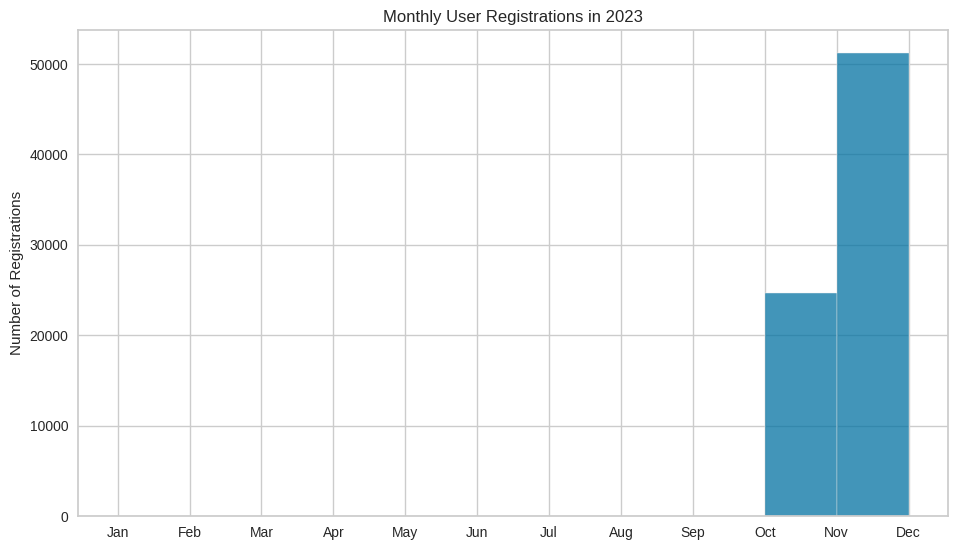

In [ ]:
user_location_merged_2023 = user_location_merged.loc[user_location_merged['join_date'].dt.year == 2023].copy()

user_location_merged_2023['join_month'] = user_location_merged_2023['join_date'].dt.month

plt.figure(figsize=(10, 6))
sns.histplot(data=user_location_merged_2023, x='join_month', bins=range(1, 13), kde=False)
plt.title('Monthly User Registrations in 2023')
plt.xlabel('')
plt.ylabel('Number of Registrations')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

Gambar tersebut menunjukkan histogram jumlah pendaftaran pengguna bulanan pada tahun 2023. Pada gambar, terlihat bahwa tidak ada pendaftaran dari Januari hingga September, kemudian ada peningkatan pendaftaran pada bulan Oktober dan lonjakan signifikan pada bulan November dan Desember. Hal ini menggambarkan tren pendaftaran yang meningkat tajam di akhir tahun 2023.

## Registrasi User pada tahun 2024

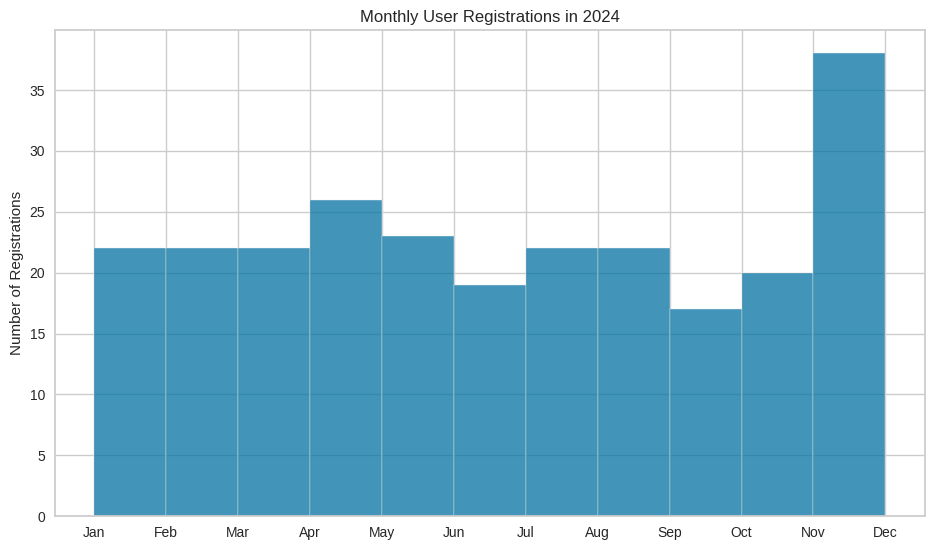

In [ ]:
user_location_merged_2024 = user_location_merged.loc[user_location_merged['join_date'].dt.year == 2024].copy()

user_location_merged_2024['join_month'] = user_location_merged_2024['join_date'].dt.month

plt.figure(figsize=(10, 6))
sns.histplot(data=user_location_merged_2024, x='join_month', bins=range(1, 13), kde=False)
plt.title('Monthly User Registrations in 2024')
plt.xlabel('')
plt.ylabel('Number of Registrations')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.show()

Gambar tersebut menunjukkan histogram jumlah pendaftaran pengguna bulanan pada tahun 2024. Histogram ini memperlihatkan bahwa pendaftaran pengguna cukup stabil sepanjang tahun dengan sedikit peningkatan pada bulan April dan lonjakan signifikan pada bulan Desember. Hal ini menunjukkan adanya tren pendaftaran yang lebih merata sepanjang tahun 2024 dibandingkan tahun sebelumnya.

## Distribusi Usia

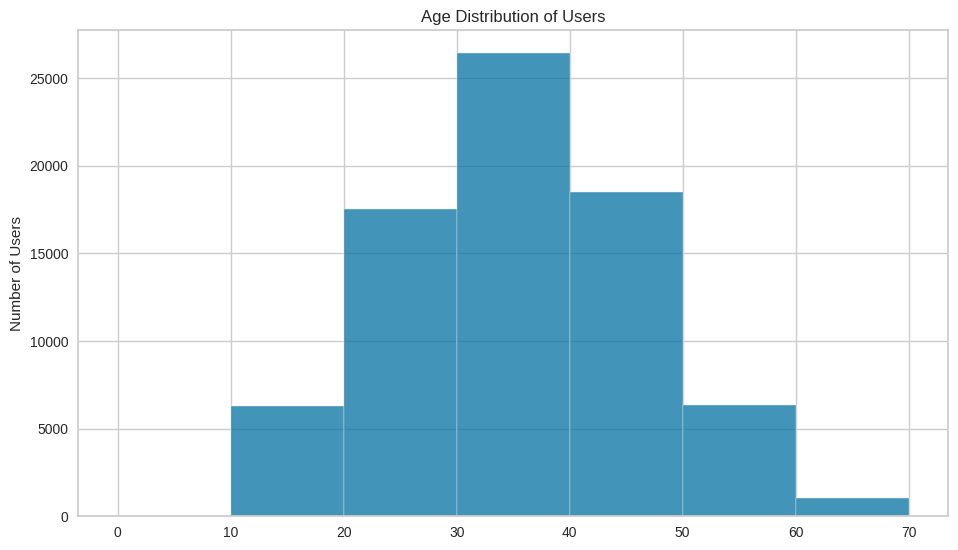

In [ ]:
user_location_merged['birth'] = pd.to_datetime(user_location_merged['birth'])

max_registration_date = user_location_merged['join_date'].max()
user_location_merged['age'] = (max_registration_date - user_location_merged['birth']).dt.days // 365

plt.figure(figsize=(10, 6))
sns.histplot(data=user_location_merged, x='age', bins=range(0, user_location_merged['age'].max() + 10, 10), kde=False)
plt.title('Age Distribution of Users')
plt.xlabel('')
plt.ylabel('Number of Users')
plt.show()

Gambar tersebut menunjukkan histogram distribusi usia pengguna. Histogram ini memperlihatkan bahwa mayoritas pengguna berada dalam rentang usia 20 hingga 40 tahun, dengan puncak tertinggi pada kelompok usia 30-an. Jumlah pengguna menurun secara signifikan di usia 50 tahun ke atas, menunjukkan bahwa platform ini lebih populer di kalangan orang dewasa muda.

## Distribusi Nilai Bruto

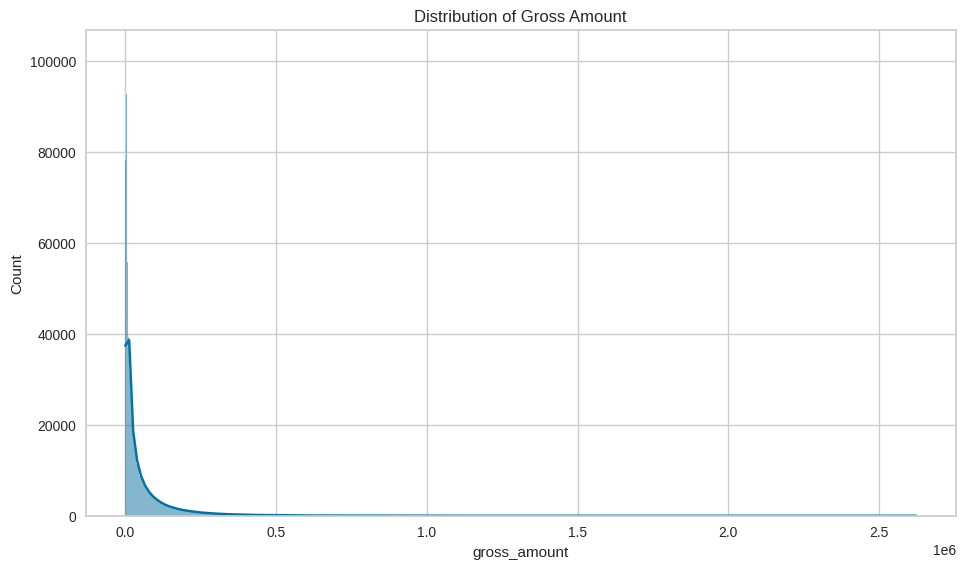

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(level_product_merged['gross_amount'], kde=True)
plt.title('Distribution of Gross Amount')
plt.show()

Gambar tersebut menunjukkan histogram distribusi nilai bruto (`gross_amount`). Histogram ini menunjukkan bahwa sebagian besar nilai bruto sangat rendah, dengan jumlah yang sangat besar di dekat nol. Distribusi menurun tajam seiring dengan meningkatnya nilai bruto, menunjukkan bahwa transaksi dengan nilai tinggi jarang terjadi.

## Distribusi Diskon

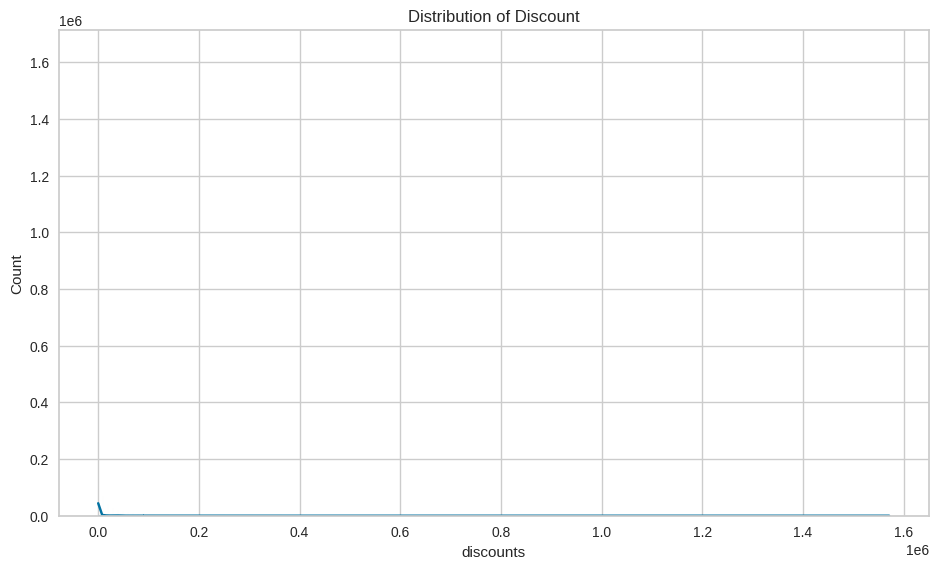

In [ ]:
plt.figure(figsize=(10, 6))
sns.histplot(level_product_merged['discounts'], kde=True)
plt.title('Distribution of Discount')
plt.show()

Gambar tersebut menunjukkan histogram distribusi diskon (discounts). Histogram ini menunjukkan bahwa sebagian besar diskon yang diberikan sangat kecil, dengan jumlah terbesar berada di dekat nol. Distribusi menurun tajam seiring dengan meningkatnya nilai diskon, menunjukkan bahwa diskon dalam jumlah besar jarang terjadi.

## 10 Produk Terlaris

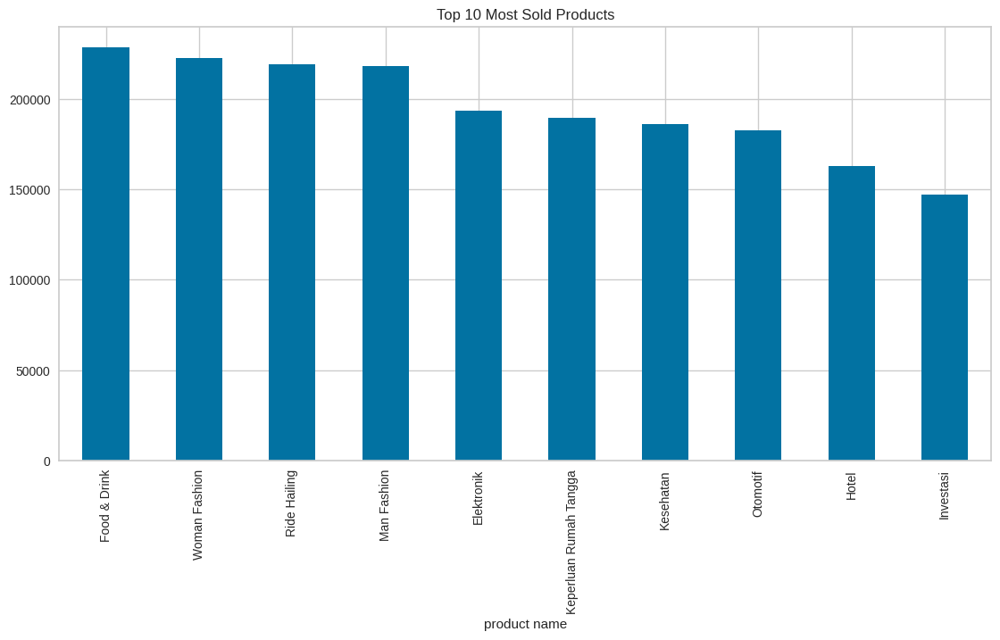

In [ ]:
product_sales = level_product_merged['product name'].value_counts().head(10)
product_sales.plot(kind='bar', figsize=(12, 6))
plt.title('Top 10 Most Sold Products')
plt.show()

Gambar tersebut menunjukkan grafik batang dari 10 produk terlaris berdasarkan jumlah penjualan. Grafik ini memperlihatkan bahwa "Food & Drink" adalah kategori produk dengan penjualan tertinggi, diikuti oleh "Woman Fashion" dan "Ride Hailing". Produk-produk lainnya dalam daftar top 10 termasuk "Man Fashion", "Elektronik", "Keperluan Rumah Tangga", "Kesehatan", "Otomotif", "Hotel", dan "Investasi", dengan penjualan yang bervariasi tetapi masih tinggi.

## Gambaran Hubungan antara Nilai Bruto dengan Diskon

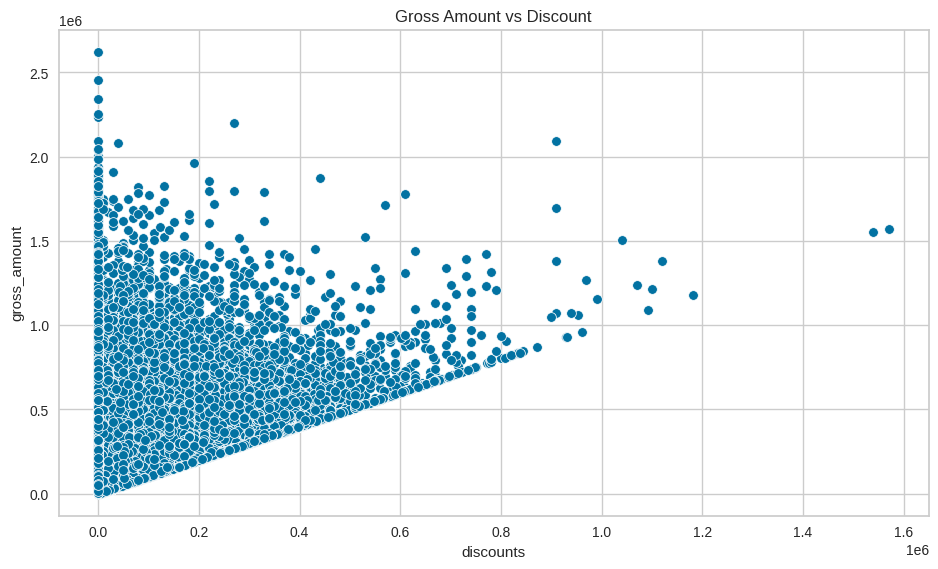

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=level_product_merged, x='discounts', y='gross_amount')
plt.title('Gross Amount vs Discount')
plt.show()

Gambar tersebut menunjukkan scatter plot yang menggambarkan hubungan antara nilai bruto (gross_amount) dan diskon (discounts). Scatter plot ini memperlihatkan bahwa terdapat banyak transaksi dengan nilai bruto dan diskon yang rendah. Namun, terdapat juga beberapa transaksi dengan nilai bruto dan diskon yang lebih tinggi, menunjukkan adanya korelasi positif antara kedua variabel ini. Transaksi dengan diskon lebih besar cenderung memiliki nilai bruto yang lebih tinggi.

## Linechart Nilai Bruto Bulanan

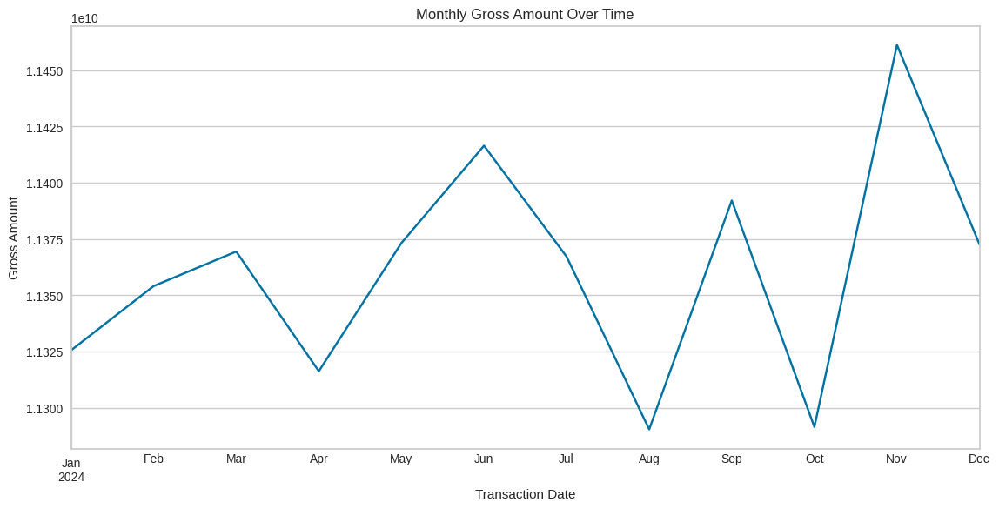

In [ ]:
level_product_merged['transaction_date'] = pd.to_datetime(level_product_merged['transaction_date'])

level_product_merged.set_index('transaction_date', inplace=True)

monthly_gross_amount = level_product_merged['gross_amount'].resample('M').sum()

plt.figure(figsize=(12, 6))
monthly_gross_amount.plot(kind='line')
plt.title('Monthly Gross Amount Over Time')
plt.xlabel('Transaction Date')
plt.ylabel('Gross Amount')
plt.show()

level_product_merged.reset_index(inplace=True)


Gambar tersebut menunjukkan grafik garis yang menggambarkan jumlah bruto bulanan (gross amount) sepanjang tahun 2024. Grafik ini memperlihatkan fluktuasi dalam jumlah bruto setiap bulan, dengan beberapa puncak dan lembah. Puncak tertinggi terlihat pada bulan Juni dan November, sementara penurunan terbesar terjadi pada bulan April dan September, menunjukkan variasi signifikan dalam pendapatan bruto bulanan sepanjang tahun.

## Heatmap Korelasi antara Nilai Bruto dengan Diskon

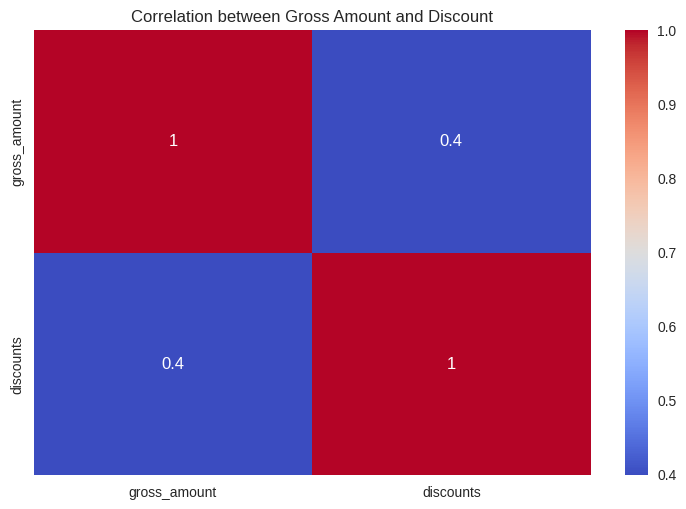

In [ ]:
correlation = level_product_merged[['gross_amount', 'discounts']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Correlation between Gross Amount and Discount')
plt.show()

Gambar tersebut menunjukkan heatmap yang menggambarkan korelasi antara jumlah bruto (gross_amount) dan diskon (discounts). Heatmap ini menunjukkan bahwa terdapat korelasi positif sedang sebesar 0.4 antara jumlah bruto dan diskon. Nilai korelasi ini menunjukkan bahwa ketika diskon meningkat, jumlah bruto juga cenderung meningkat, meskipun tidak dengan hubungan yang sangat kuat.

# **Modelling**

## Forecasting

### Jawa Tengah

#### Features Engineering

In [ ]:
level_1['transaction_date'] = pd.to_datetime(level_1['transaction_date'])

In [ ]:
print(min(level_1['transaction_date']))
print(max(level_1['transaction_date']))

2024-01-01 00:00:00
2024-12-31 00:00:00


In [ ]:
agg_data_level_1 = level_1.groupby(['transaction_date']).agg({'gross_amount': 'sum'}).reset_index()

In [ ]:
level_1 = agg_data_level_1.set_index('transaction_date')

In [ ]:
level_1.head()

,gross_amount
transaction_date,
2024-01-01,326332700.00
2024-01-02,334973700.00
2024-01-03,323636100.00
2024-01-04,330316500.00
2024-01-05,325633000.00


<Axes: xlabel='transaction_date'>

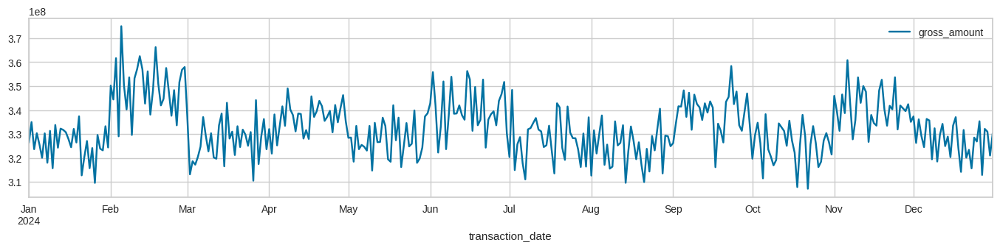

In [ ]:
level_1.plot(figsize= (15,3))

In [ ]:
import plotly.express as px
from statsmodels.tsa.seasonal import seasonal_decompose

def seasonal_decomposition(df, column_name):
    result_mul = seasonal_decompose (df[column_name], model= 'multiplicative', extrapolate_trend='freq')
    result_add = seasonal_decompose (df[column_name], model='additive', extrapolate_trend= 'freq')

    return result_mul, result_add

def plot(result_mul, result_add):
    fig = px.line (title= 'Multiplicative Decomposition')
    fig.add_scatter(x=result_mul.trend.index, y=result_mul.trend, mode='lines', name='Trend')
    fig.add_scatter(x=result_mul.seasonal.index, y=result_mul.seasonal, mode='lines', name='Seasonal')
    fig.add_scatter(x=result_mul.resid. index, y=result_mul. resid, mode='lines', name='Residual')

    fig.update_layout(xaxis_title='Date', yaxis_title='Value')
    fig.show()

    fig = px.line(title='Additive Decomposition')
    fig.add_scatter(x=result_add.trend.index, y=result_add.trend, mode='lines', name= 'Trend')
    fig.add_scatter(x=result_add.seasonal.index, y=result_add.seasonal, mode='lines', name= 'Seasonal')
    fig.add_scatter(x=result_add.resid.index, y=result_add.resid, mode='lines', name= 'Residual')

    fig.update_layout(xaxis_title='Date', yaxis_title='Value')
    fig.show()

In [ ]:
result_mul_1, result_add_1 = seasonal_decomposition(level_1, 'gross_amount')

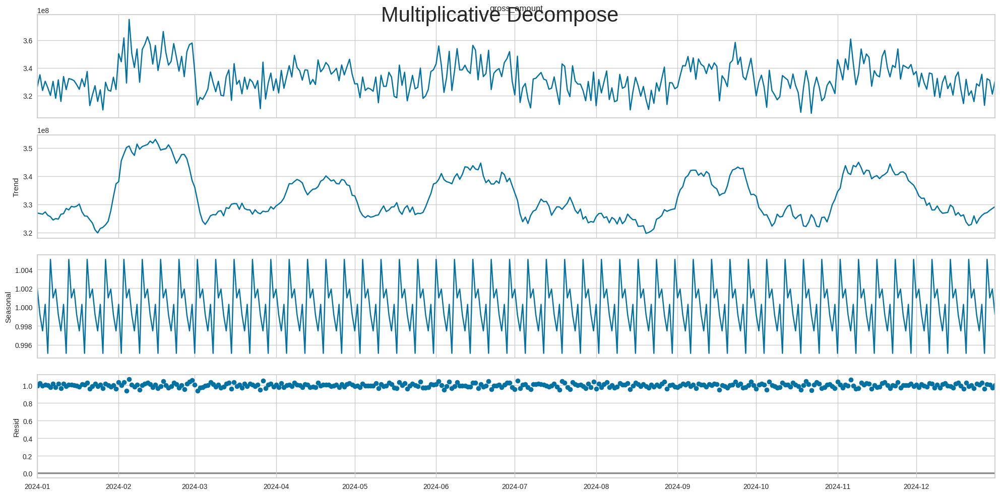

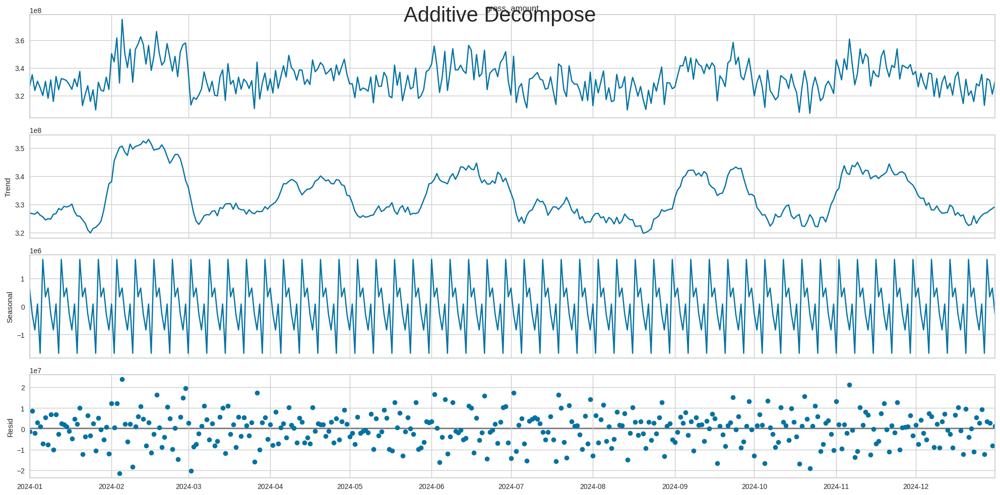

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (20, 10)})
result_mul_1.plot().suptitle('Multiplicative Decompose', fontsize=30)
result_add_1.plot().suptitle('Additive Decompose', fontsize=30)
plt.show()

Proses Dekomposisi untuk mengetahui tren, sesional dan residu dari data transaksi provinsi jawa tengah.

In [ ]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    print ('----------------------------------------------')
    adftest = adfuller(timeseries)
    adf_output = pd.Series(adftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in adftest[4].items():
        adf_output['Critical Value (%s)'%key] = value
    print (adf_output)

adf_test(level_1.values)

Results of Dickey-Fuller Test:
----------------------------------------------
Test Statistic                 -3.45
p-value                         0.01
#Lags Used                     16.00
Number of Observations Used   349.00
Critical Value (1%)            -3.45
Critical Value (5%)            -2.87
Critical Value (10%)           -2.57
dtype: float64


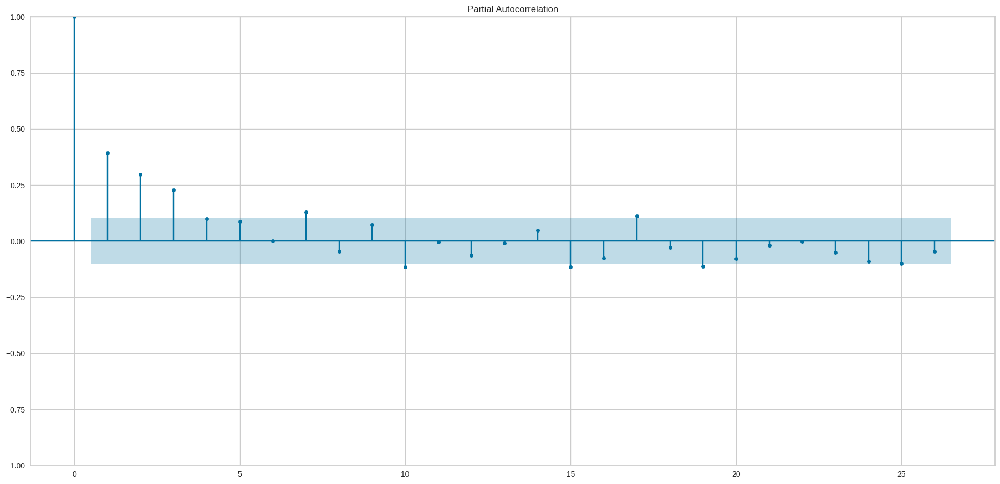

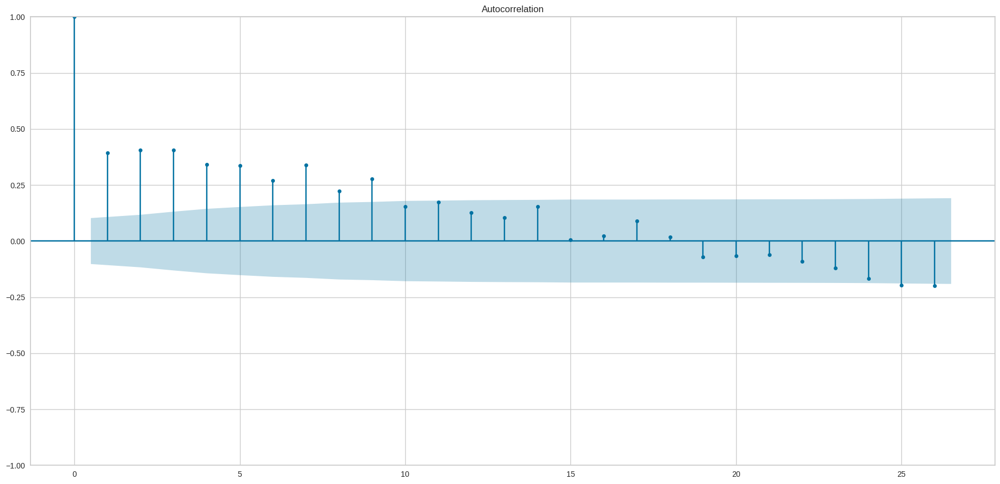

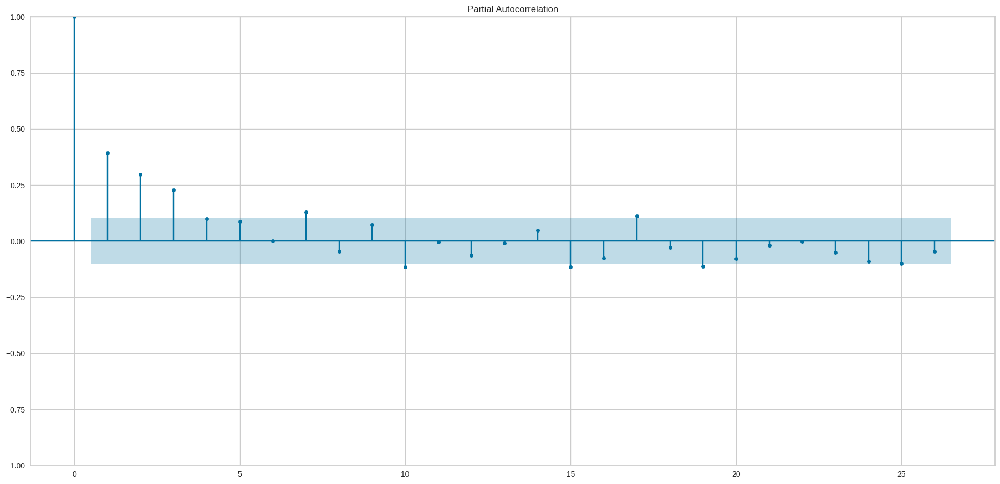

In [ ]:
plot_acf(level_1)
plot_pacf(level_1)

In [ ]:
index_split = len(level_1) - 30

train_data = level_1.iloc[:index_split]
test_data = level_1.iloc[index_split:]

Proses Splitting dataset untuk training dan test

#### Single Exponential Smoothing

In [ ]:
single_exp_1 = SimpleExpSmoothing(train_data).fit()
single_exp_train_pred_1 = single_exp_1.fittedvalues
single_exp_test_pred_1 = single_exp_1.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<Axes: title={'center': 'SES Model'}, xlabel='transaction_date'>

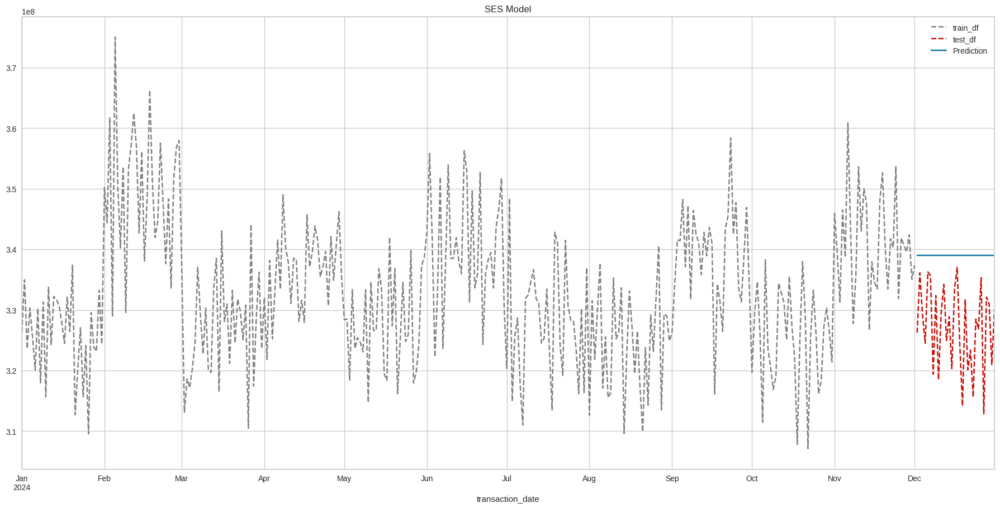

In [ ]:
train_data['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
single_exp_test_pred_1.plot(color='b', legend=True, label='Prediction', title='SES Model')

#### Double Exponential Smoothing

In [ ]:
double_exp_1 = ExponentialSmoothing(train_data, trend=None, initialization_method='heuristic', seasonal='add', seasonal_periods=29, damped_trend=False).fit()
double_exp_train_pred_1 = double_exp_1.fittedvalues
double_exp_test_pred_1 = double_exp_1.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


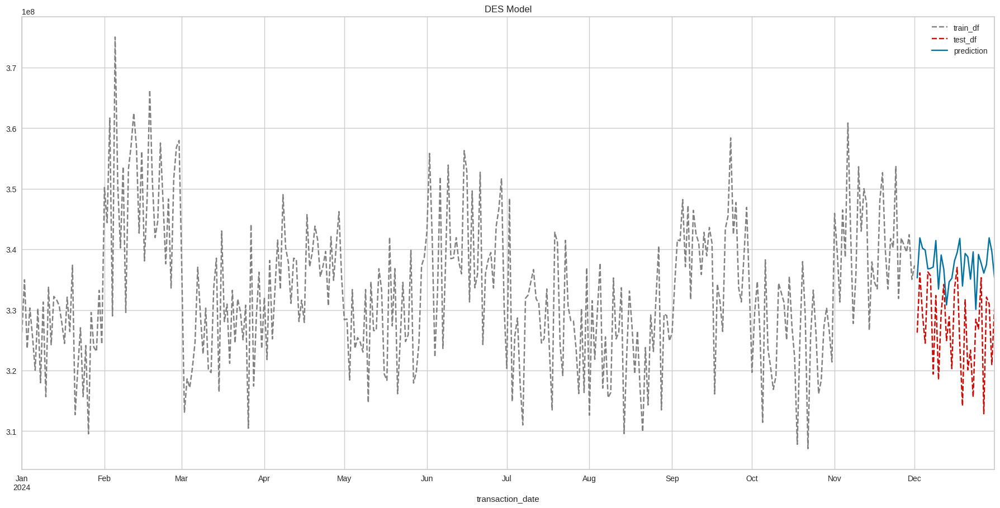

In [ ]:
train_data['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
double_exp_test_pred_1.plot(color='b', legend=True, label='prediction',title='DES Model')
plt.show()

#### Triple Exponential Smoothing

In [ ]:
hw_model_1 = ExponentialSmoothing(train_data['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
hw_train_pred_1 =  hw_model_1.fittedvalues
hw_test_pred_1 =  hw_model_1.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


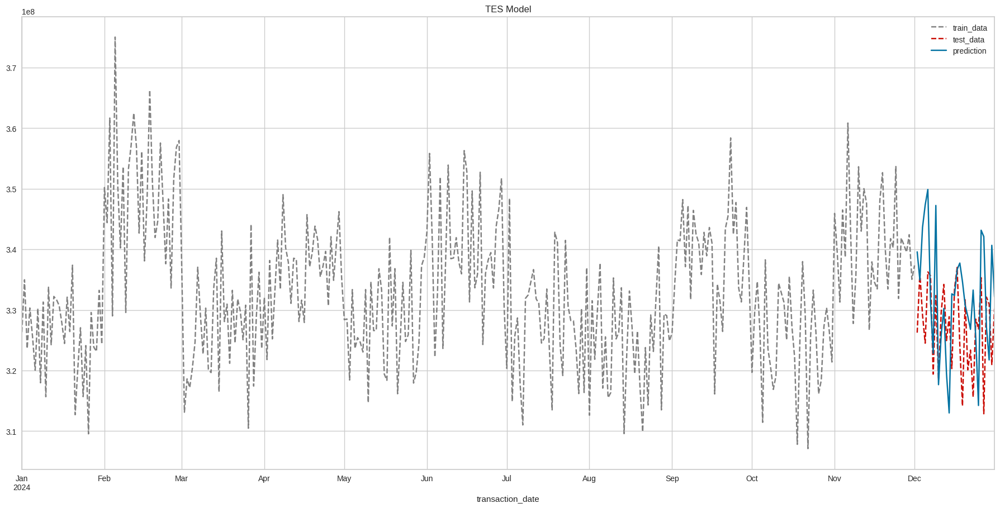

In [ ]:
train_data['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
hw_test_pred_1.plot(color='b', legend=True, label='prediction', title='TES Model')
plt.show()

#### ARIMA

In [ ]:
arima_1 = ARIMA(train_data['gross_amount'], order=(25,0,26)).fit()
arima_train_pred_1 = arima_1.predict()
arima_test_pred_1 = arima_1.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  

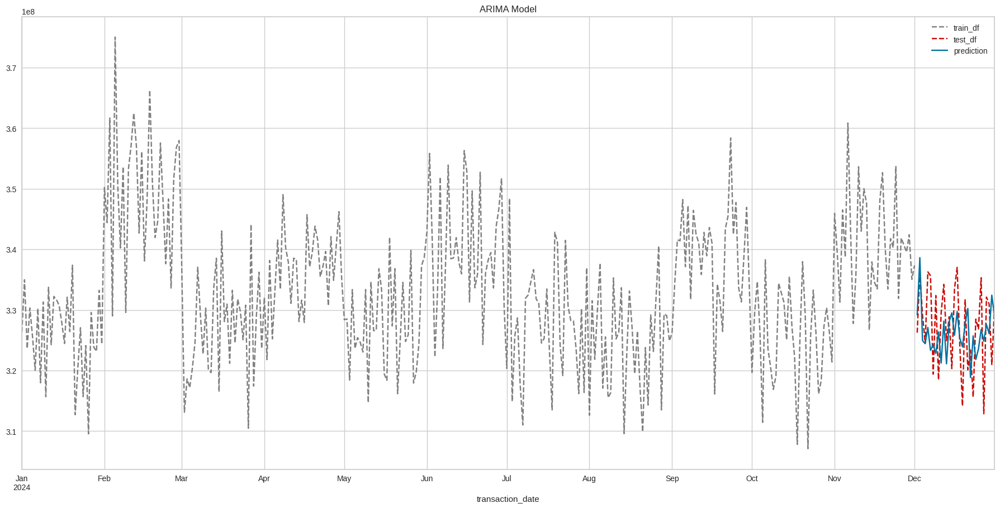

In [ ]:
train_data['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred_1.plot(color='b', legend=True, label='prediction',title='ARIMA Model')
plt.show()

#### Final Model Forecast Jawa Tengah

In [ ]:
final_model_1 = ExponentialSmoothing(train_data['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
final_test_pred_1 =  final_model_1.forecast(60)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


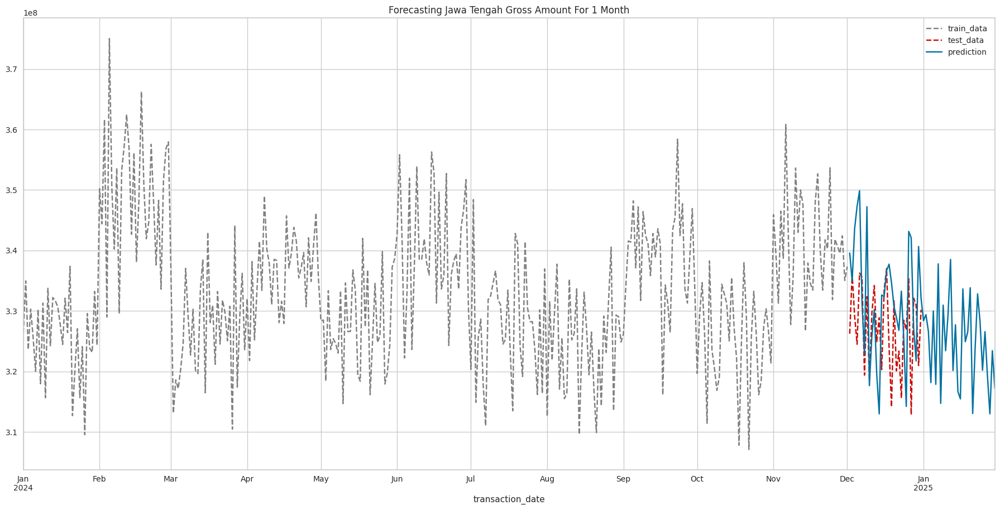

In [ ]:
train_data['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
final_test_pred_1.plot(color='b', legend=True, label='prediction', title='Forecasting Jawa Tengah Gross Amount For 1 Month')
plt.show()

### Sulawesi Tenggara

#### Features Engineering

In [ ]:
level_2['transaction_date'] = pd.to_datetime(level_2['transaction_date'])

In [ ]:
print(min(level_2['transaction_date']))
print(max(level_2['transaction_date']))

2024-01-01 00:00:00
2024-12-31 00:00:00


In [ ]:
agg_data_level_2 = level_2.groupby(['transaction_date']).agg({'gross_amount': 'sum'}).reset_index()

In [ ]:
level_2 = agg_data_level_2.set_index('transaction_date')

In [ ]:
level_2.head()

,gross_amount
transaction_date,
2024-01-01,27274400.00
2024-01-02,18146300.00
2024-01-03,23223200.00
2024-01-04,23099000.00
2024-01-05,26042600.00


<Axes: xlabel='transaction_date'>

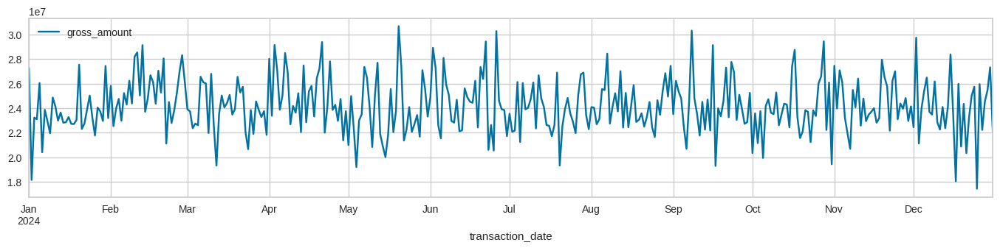

In [ ]:
level_2.plot(figsize= (15,3))

In [ ]:
result_mul_2, result_add_2 = seasonal_decomposition(level_2, 'gross_amount')

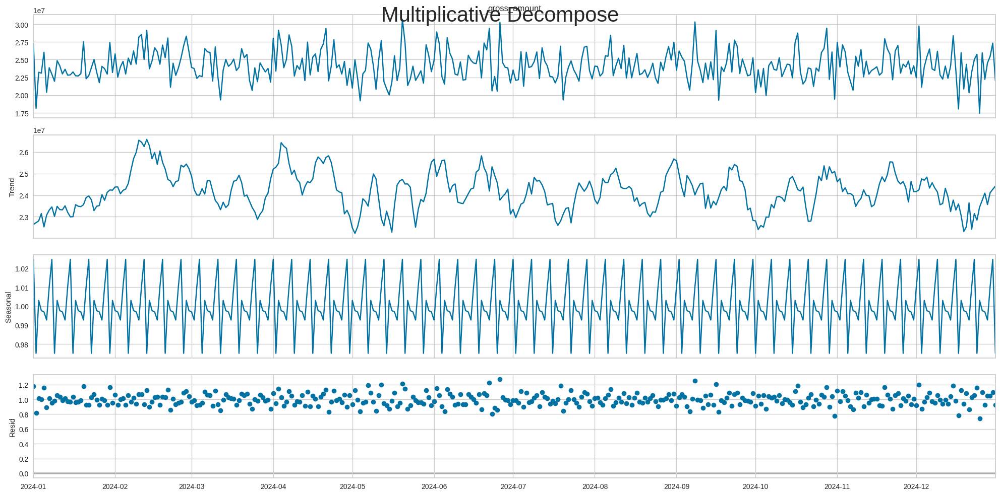

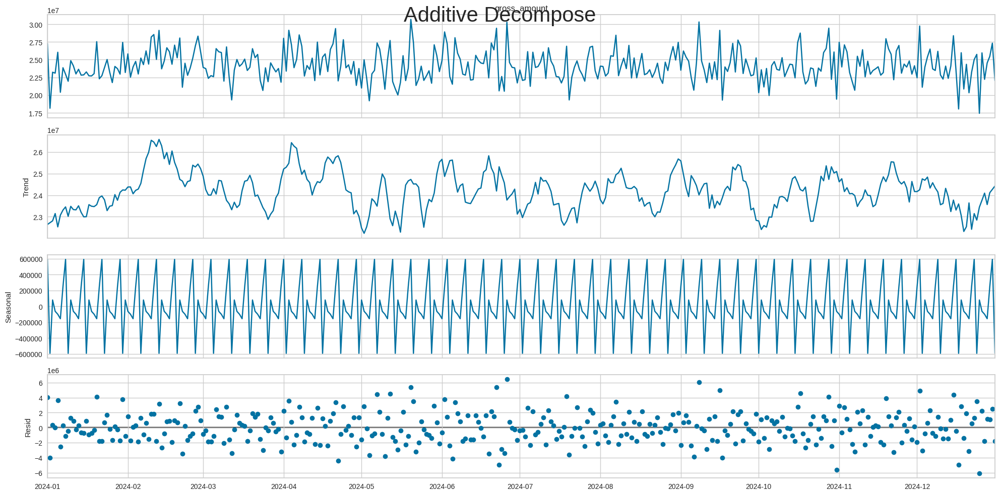

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (20, 10)})
result_mul_2.plot().suptitle('Multiplicative Decompose', fontsize=30)
result_add_2.plot().suptitle('Additive Decompose', fontsize=30)
plt.show()

Proses Dekomposisi untuk mengetahui tren, sesional dan residu dari data transaksi provinsi sulawesi tenggara.

In [ ]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    print ('----------------------------------------------')
    adftest = adfuller(timeseries)
    adf_output = pd.Series(adftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in adftest[4].items():
        adf_output['Critical Value (%s)'%key] = value
    print (adf_output)

adf_test(level_2.values)

Results of Dickey-Fuller Test:
----------------------------------------------
Test Statistic                 -8.74
p-value                         0.00
#Lags Used                      3.00
Number of Observations Used   362.00
Critical Value (1%)            -3.45
Critical Value (5%)            -2.87
Critical Value (10%)           -2.57
dtype: float64


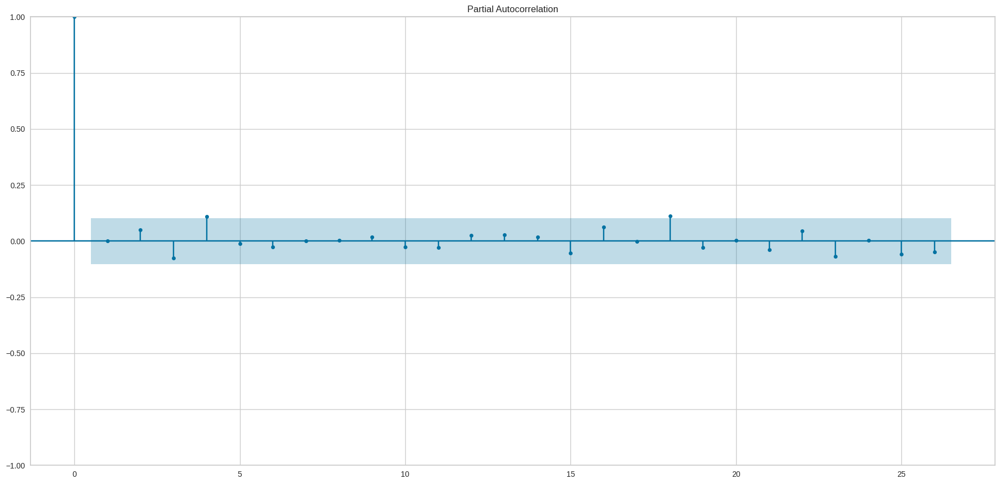

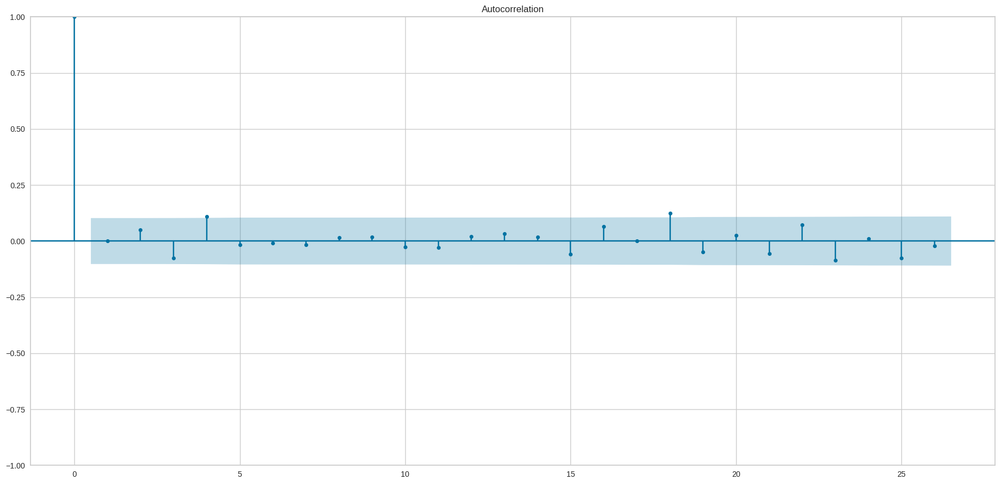

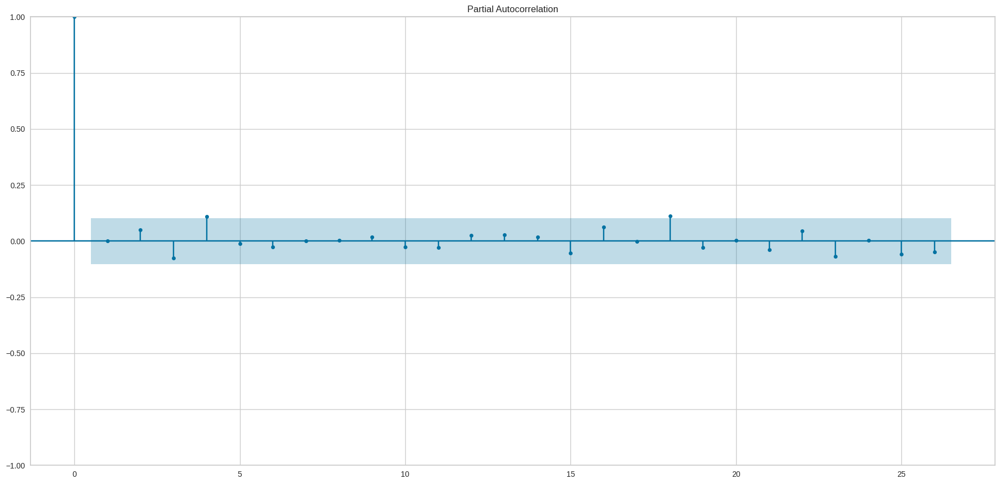

In [ ]:
plot_acf(level_2)
plot_pacf(level_2)

In [ ]:
index_split = len(level_2) - 30

train_data_2 = level_2.iloc[:index_split]
test_data_2 = level_2.iloc[index_split:]

Proses Splitting dataset untuk training dan test

#### Single Exponential Smoothing

In [ ]:
single_exp_2 = SimpleExpSmoothing(train_data_2).fit()
single_exp_train_pred_2 = single_exp_2.fittedvalues
single_exp_test_pred_2 = single_exp_2.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<Axes: title={'center': 'SES Model'}, xlabel='transaction_date'>

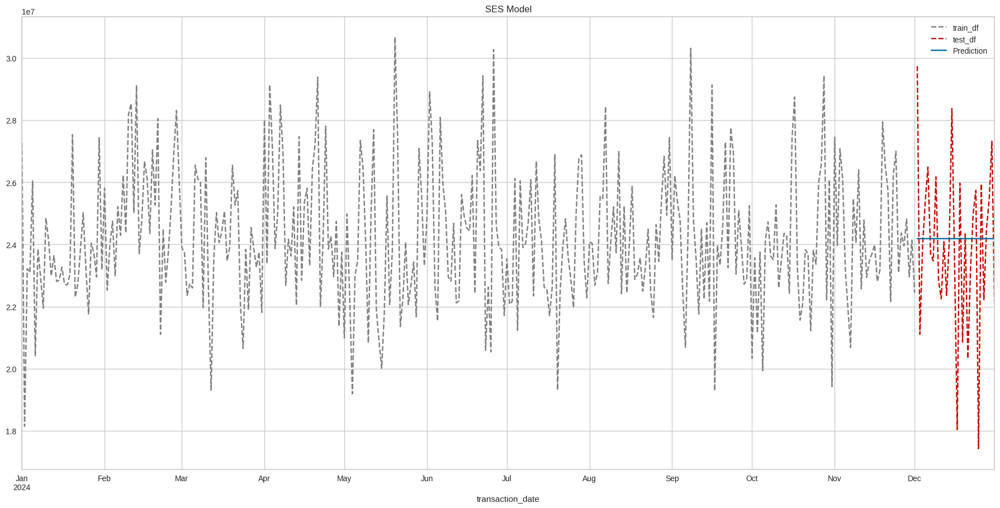

In [ ]:
train_data_2['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_2['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
single_exp_test_pred_2.plot(color='b', legend=True, label='Prediction', title='SES Model')

#### Double Exponential Smoothing

In [ ]:
double_exp_2 = ExponentialSmoothing(train_data_2, trend=None, initialization_method='heuristic', seasonal='add', seasonal_periods=7, damped_trend=False).fit()
double_exp_train_pred_2 = double_exp_2.fittedvalues
double_exp_test_pred_2 = double_exp_2.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


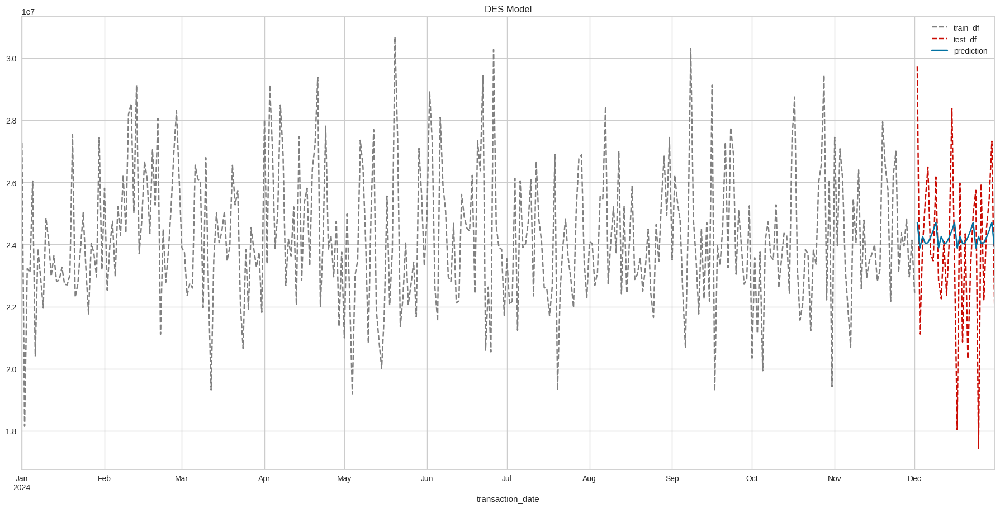

In [ ]:
train_data_2['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_2['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
double_exp_test_pred_2.plot(color='b', legend=True, label='prediction', title='DES Model')
plt.show()

#### Triple Exponential Smoothing

In [ ]:
hw_model_2 = ExponentialSmoothing(train_data_2['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
hw_train_pred_2 =  hw_model_2.fittedvalues
hw_test_pred_2 =  hw_model_2.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


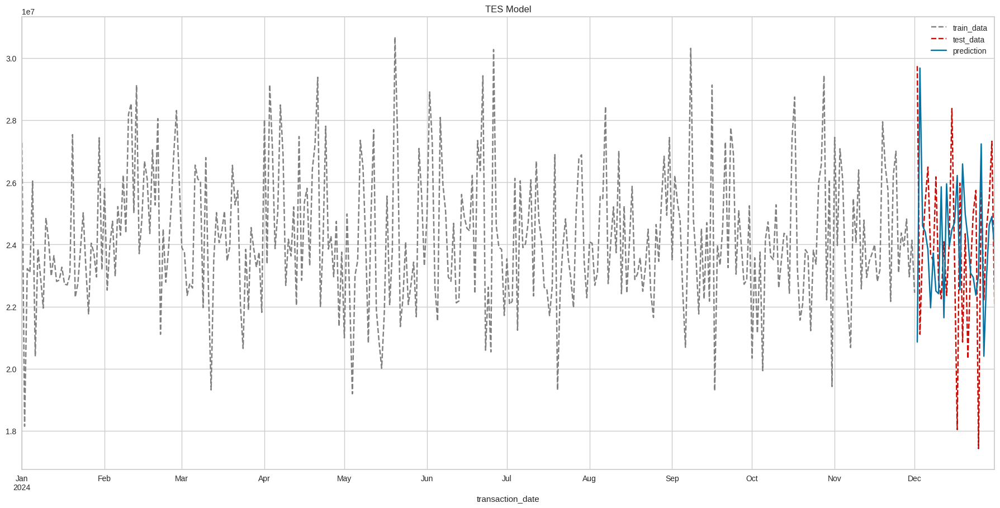

In [ ]:
train_data_2['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_2['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
hw_test_pred_2.plot(color='b', legend=True, label='prediction', title='TES Model')
plt.show()

#### ARIMA

In [ ]:
arima_2 = ARIMA(train_data_2['gross_amount'], order=(18,0,18)).fit()
arima_train_pred_2 = arima_2.predict()
arima_test_pred_2 = arima_2.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


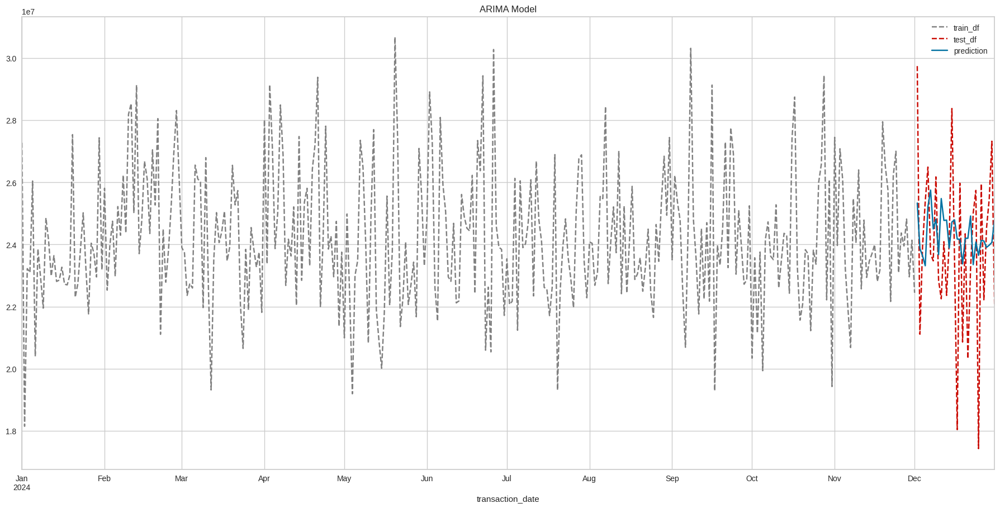

In [ ]:
train_data_2['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_2['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred_2.plot(color='b', legend=True, label='prediction',title='ARIMA Model')
plt.show()

#### Final Model Forecast Sulawesi Tenggara

In [ ]:
final_model_2 = ExponentialSmoothing(train_data_2['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
final_test_pred_2 =  final_model_2.forecast(60)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<Axes: title={'center': 'Forecasting Sulawesi Tenggara Gross Amount For 1 Month'}, xlabel='transaction_date'>

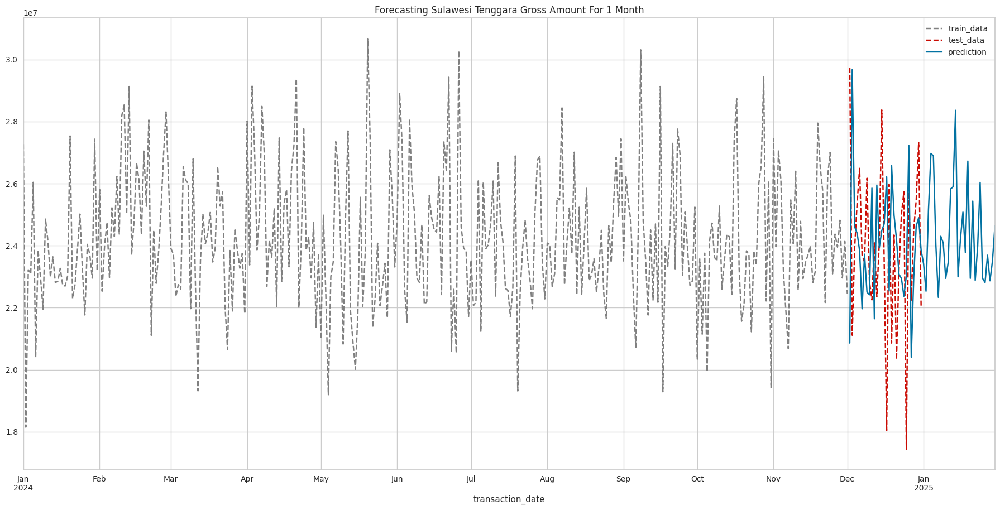

In [ ]:
train_data_2['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_2['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
final_test_pred_2.plot(color='b', legend=True, label='prediction', title='Forecasting Sulawesi Tenggara Gross Amount For 1 Month')

### Gorontalo

#### Features Engineering

In [ ]:
level_3['transaction_date'] = pd.to_datetime(level_3['transaction_date'])

In [ ]:
print(min(level_3['transaction_date']))
print(max(level_3['transaction_date']))

2024-01-01 00:00:00
2024-12-31 00:00:00


In [ ]:
agg_data_level_3 = level_3.groupby(['transaction_date']).agg({'gross_amount': 'sum'}).reset_index()

In [ ]:
level_3 = agg_data_level_3.set_index('transaction_date')

In [ ]:
level_3.head()

,gross_amount
transaction_date,
2024-01-01,14496500.00
2024-01-02,15755100.00
2024-01-03,13495600.00
2024-01-04,11483800.00
2024-01-05,13248300.00


<Axes: xlabel='transaction_date'>

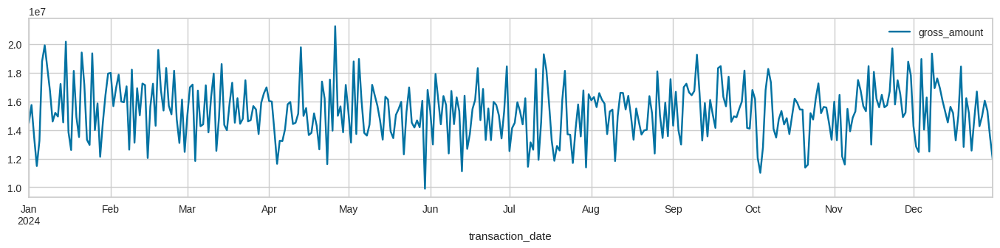

In [ ]:
level_3.plot(figsize= (15,3))

In [ ]:
result_mul_3, result_add_3 = seasonal_decomposition(level_3, 'gross_amount')

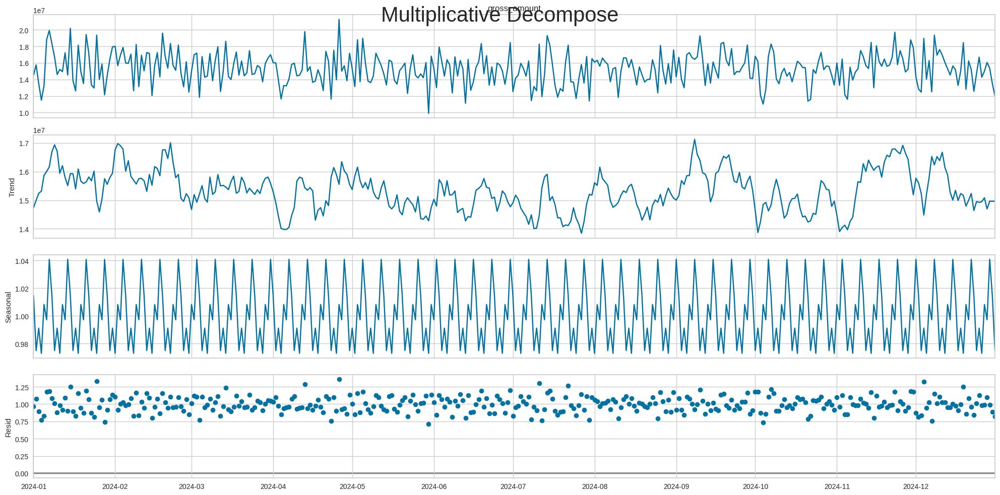

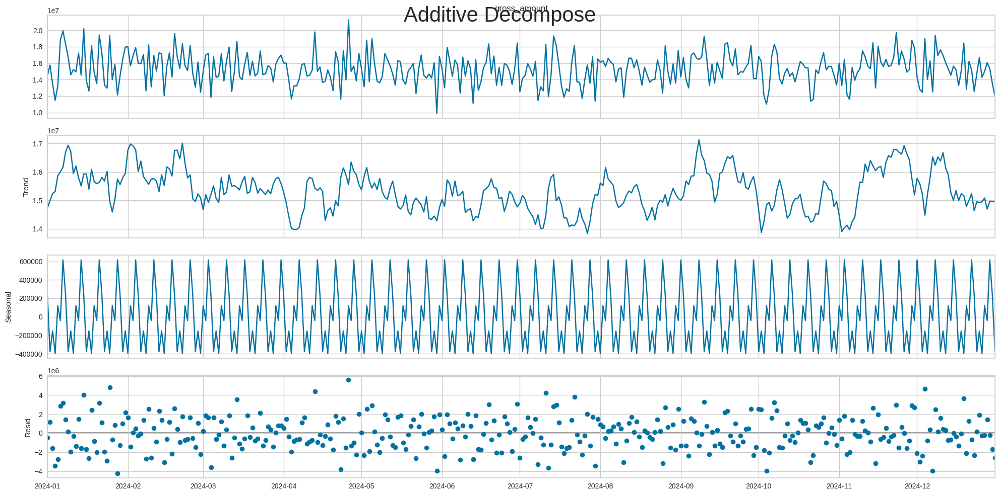

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (20, 10)})
result_mul_3.plot().suptitle('Multiplicative Decompose', fontsize=30)
result_add_3.plot().suptitle('Additive Decompose', fontsize=30)
plt.show()

Proses Dekomposisi untuk mengetahui tren, sesional dan residu dari data transaksi provinsi Gorontalo.

In [ ]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    print ('----------------------------------------------')
    adftest = adfuller(timeseries)
    adf_output = pd.Series(adftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in adftest[4].items():
        adf_output['Critical Value (%s)'%key] = value
    print (adf_output)

adf_test(level_3.values)

Results of Dickey-Fuller Test:
----------------------------------------------
Test Statistic                -19.03
p-value                         0.00
#Lags Used                      0.00
Number of Observations Used   365.00
Critical Value (1%)            -3.45
Critical Value (5%)            -2.87
Critical Value (10%)           -2.57
dtype: float64


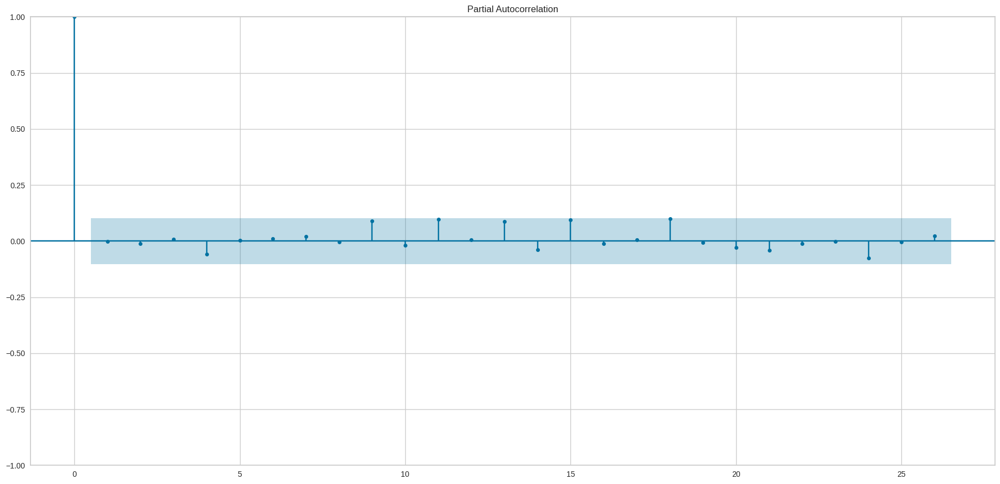

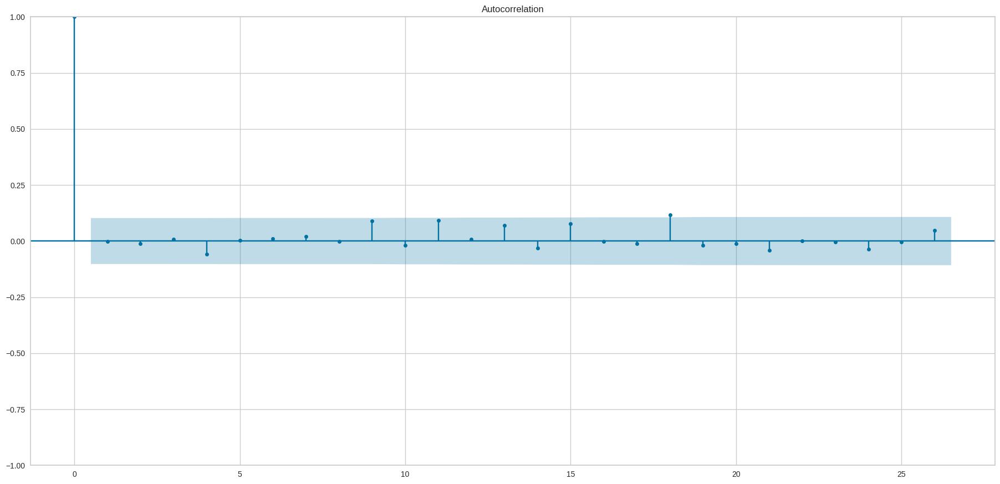

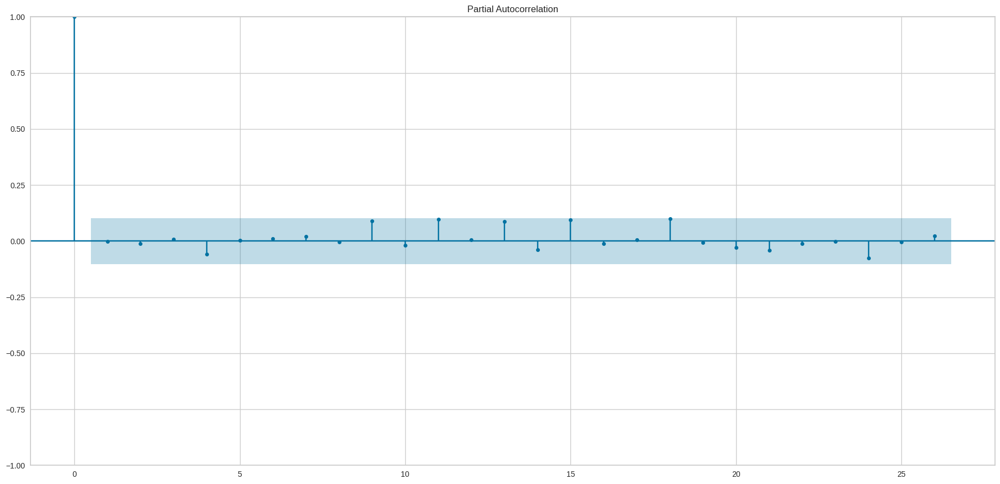

In [ ]:
plot_acf(level_3)
plot_pacf(level_3)

In [ ]:
index_split = len(level_3) - 30

train_data_3 = level_3.iloc[:index_split]
test_data_3 = level_3.iloc[index_split:]

Proses Splitting dataset untuk training dan test

#### Single Exponential Smoothing

In [ ]:
single_exp_3 = SimpleExpSmoothing(train_data_3).fit()
single_exp_train_pred_3 = single_exp_3.fittedvalues
single_exp_test_pred_3 = single_exp_3.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<Axes: title={'center': 'SES Model'}, xlabel='transaction_date'>

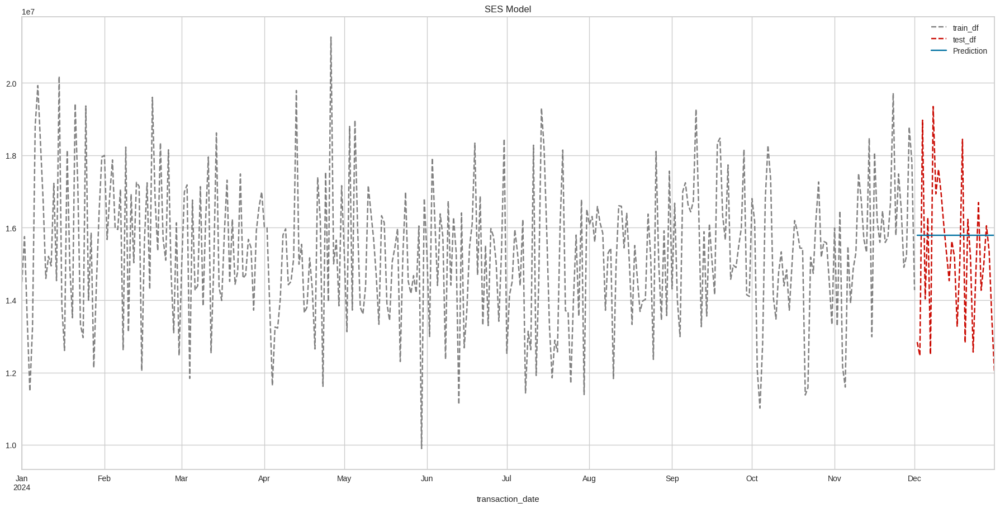

In [ ]:
train_data_3['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_3['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
single_exp_test_pred_3.plot(color='b', legend=True, label='Prediction',title='SES Model')

#### Double Exponential Smoothing

In [ ]:
double_exp_3 = ExponentialSmoothing(train_data_3, trend=None, initialization_method='heuristic', seasonal='add', seasonal_periods=29, damped_trend=False).fit()
double_exp_train_pred_3 = double_exp_3.fittedvalues
double_exp_test_pred_3 = double_exp_3.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


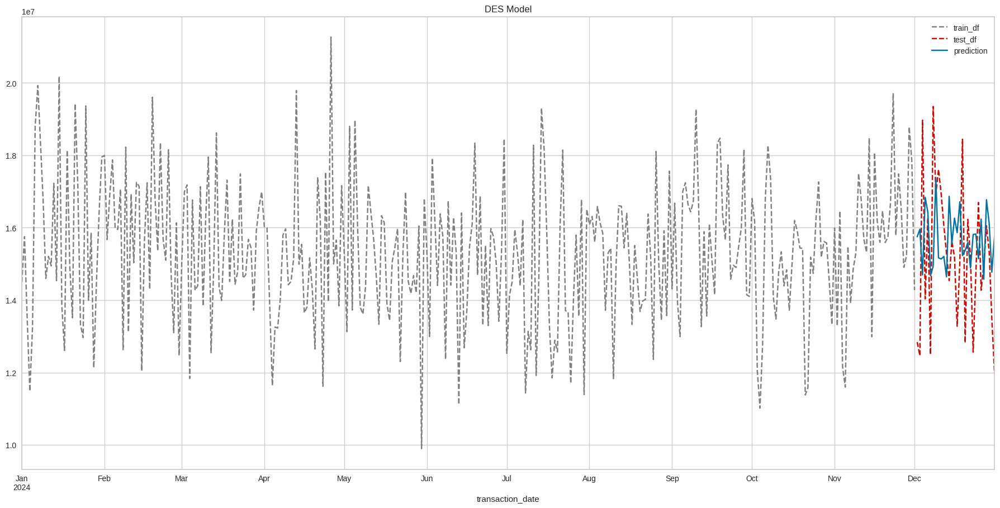

In [ ]:
train_data_3['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_3['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
double_exp_test_pred_3.plot(color='b', legend=True, label='prediction',title='DES Model')
plt.show()

#### Triple Exponential Smoothing

In [ ]:
hw_model_3 = ExponentialSmoothing(train_data_3['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
hw_train_pred_3 =  hw_model_3.fittedvalues
hw_test_pred_3 =  hw_model_3.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


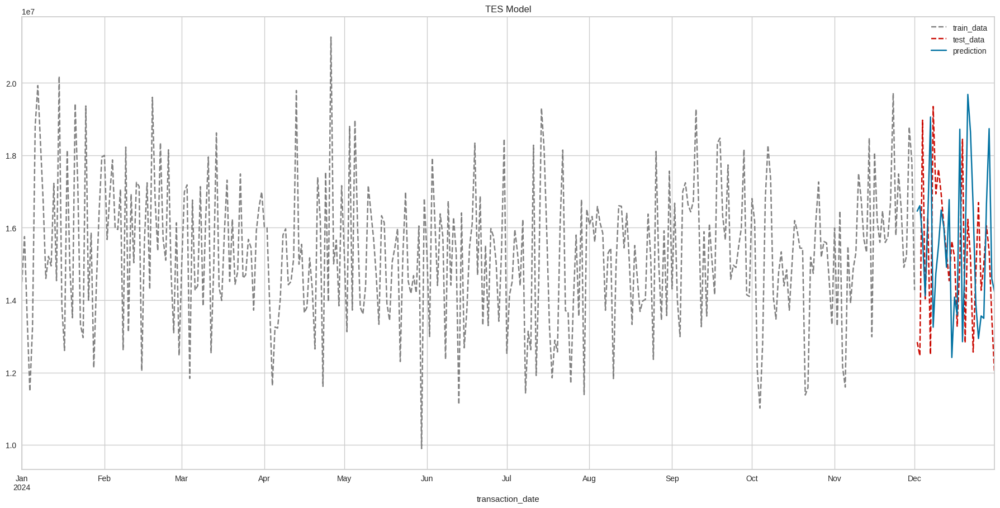

In [ ]:
train_data_3['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_3['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
hw_test_pred_3.plot(color='b', legend=True, label='prediction',title='TES Model')
plt.show()

#### ARIMA

In [ ]:
arima_3 = ARIMA(train_data_3['gross_amount'], order=(18,0,18)).fit()
arima_train_pred_3 = arima_3.predict()
arima_test_pred_3 = arima_3.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

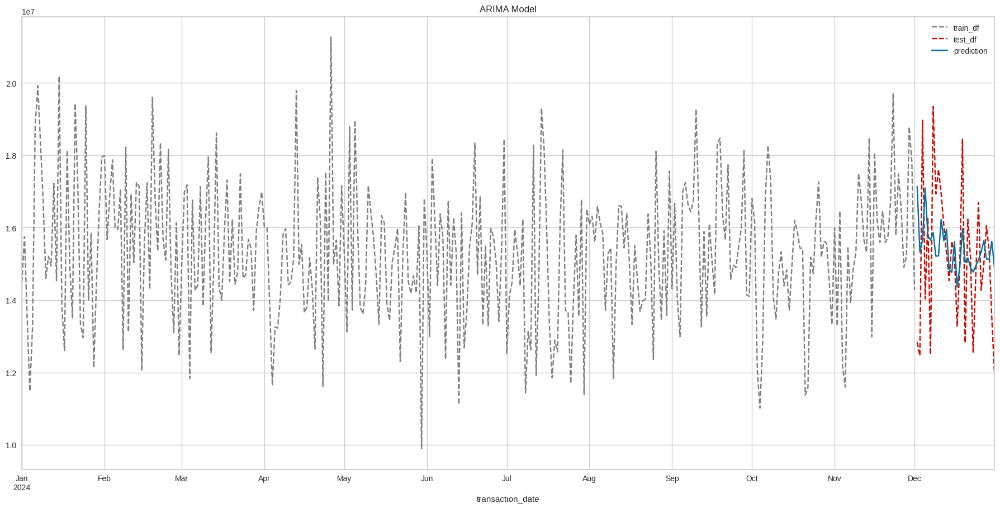

In [ ]:
train_data_3['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_3['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred_3.plot(color='b', legend=True, label='prediction', title='ARIMA Model')
plt.show()

#### Final Model Forecast Gorontalo

In [ ]:
final_model_3 = ExponentialSmoothing(train_data_3['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
final_train_pred_3 =  final_model_3.fittedvalues
final_test_pred_3 =  final_model_3.forecast(60)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


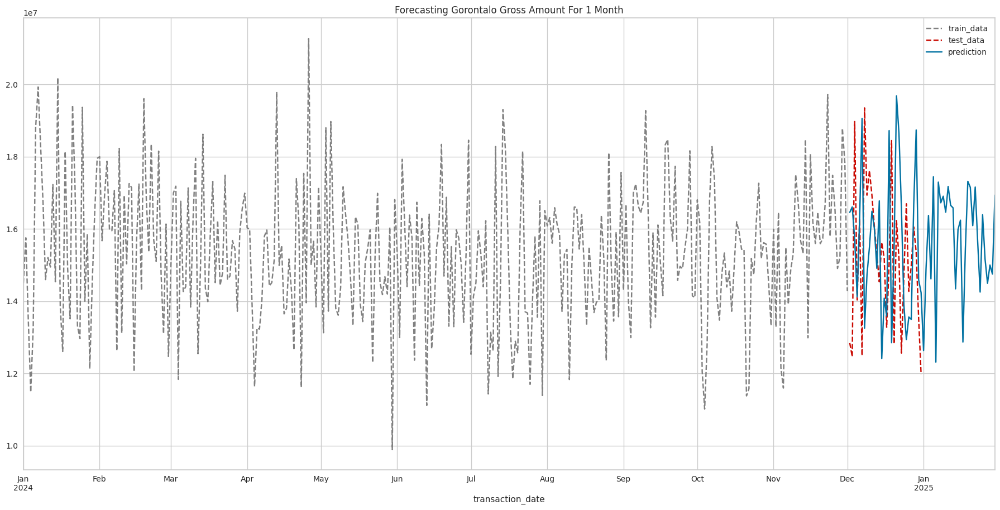

In [ ]:
train_data_3['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_3['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
final_test_pred_3.plot(color='b', legend=True, label='prediction',title='Forecasting Gorontalo Gross Amount For 1 Month')
plt.show()

### Papua Tengah

#### Features Engineering

In [ ]:
level_4['transaction_date'] = pd.to_datetime(level_4['transaction_date'])

In [ ]:
print(min(level_4['transaction_date']))
print(max(level_4['transaction_date']))

2024-01-01 00:00:00
2024-12-31 00:00:00


In [ ]:
agg_data_level_4 = level_4.groupby(['transaction_date']).agg({'gross_amount': 'sum'}).reset_index()

In [ ]:
level_4 = agg_data_level_4.set_index('transaction_date')

In [ ]:
level_4.head()

,gross_amount
transaction_date,
2024-01-01,425700.00
2024-01-02,129300.00
2024-01-03,491300.00
2024-01-04,456800.00
2024-01-05,527100.00


<Axes: xlabel='transaction_date'>

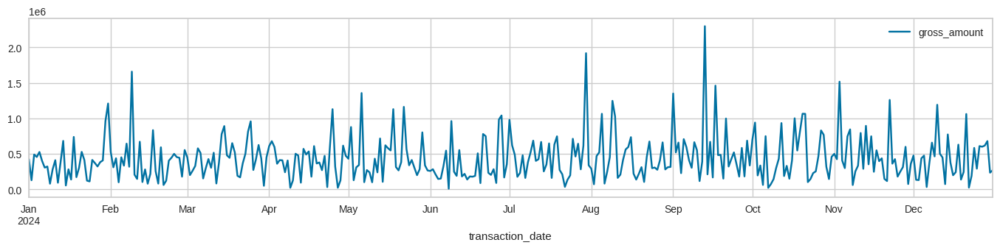

In [ ]:
level_4.plot(figsize= (15,3))

In [ ]:
result_mul_4, result_add_4 = seasonal_decomposition(level_4, 'gross_amount')

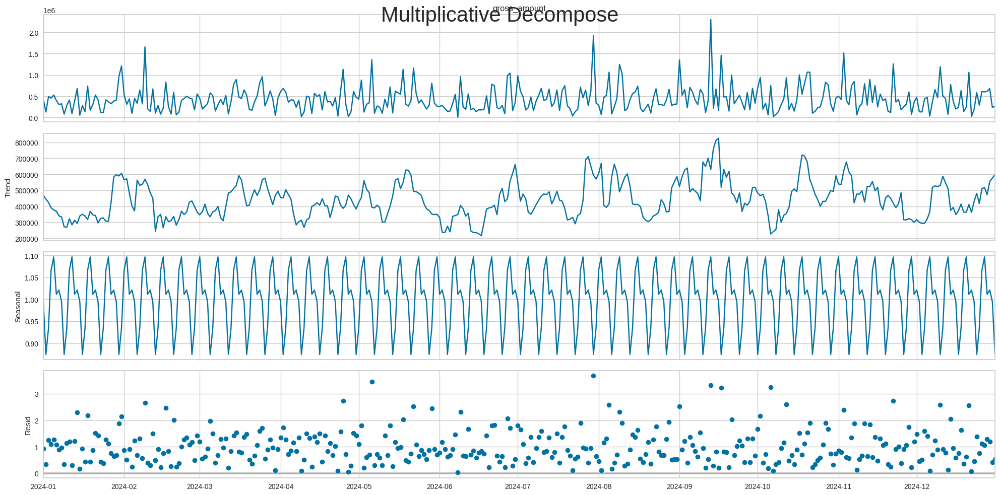

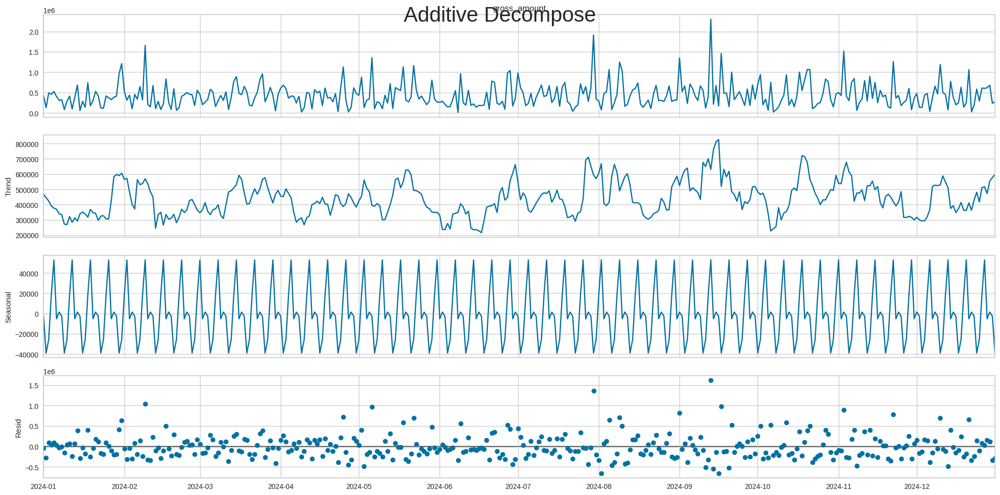

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize': (20, 10)})
result_mul_4.plot().suptitle('Multiplicative Decompose', fontsize=30)
result_add_4.plot().suptitle('Additive Decompose', fontsize=30)
plt.show()

Proses Dekomposisi untuk mengetahui tren, sesional dan residu dari data transaksi provinsi papua tengah.

In [ ]:
def adf_test(timeseries):
    print ('Results of Dickey-Fuller Test:')
    print ('----------------------------------------------')
    adftest = adfuller(timeseries)
    adf_output = pd.Series(adftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in adftest[4].items():
        adf_output['Critical Value (%s)'%key] = value
    print (adf_output)

adf_test(level_4.values)

Results of Dickey-Fuller Test:
----------------------------------------------
Test Statistic                 -9.33
p-value                         0.00
#Lags Used                      3.00
Number of Observations Used   362.00
Critical Value (1%)            -3.45
Critical Value (5%)            -2.87
Critical Value (10%)           -2.57
dtype: float64


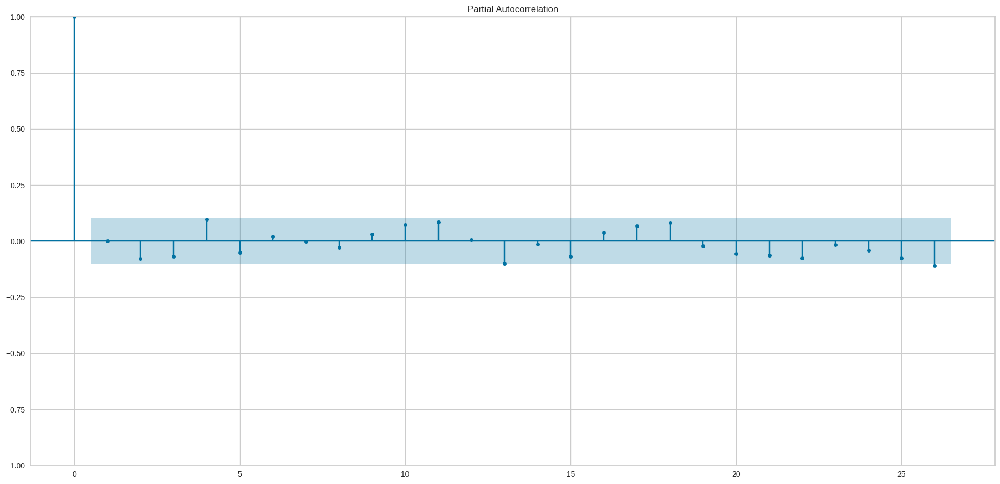

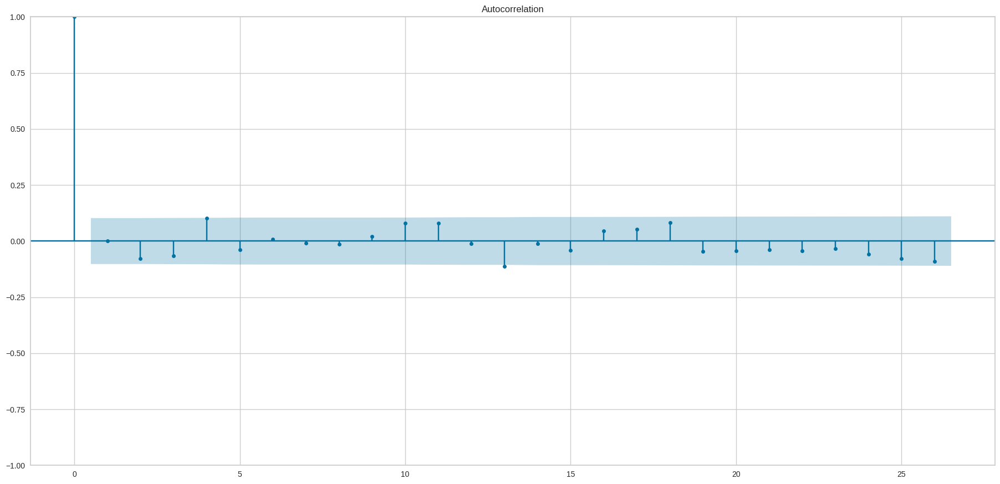

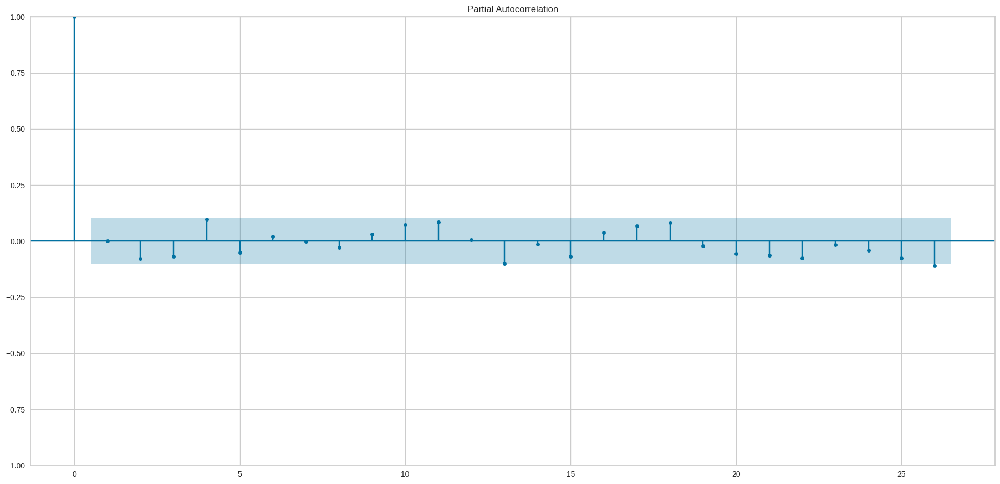

In [ ]:
plot_acf(level_4)
plot_pacf(level_4)

In [ ]:
index_split = len(level_4) - 30

train_data_4 = level_4.iloc[:index_split]
test_data_4 = level_4.iloc[index_split:]

Proses Splitting dataset untuk training dan test

#### Single Exponential Smoothing

In [ ]:
single_exp_4 = SimpleExpSmoothing(train_data_4).fit()
single_exp_train_pred_4 = single_exp_4.fittedvalues
single_exp_test_pred_4 = single_exp_4.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


<Axes: title={'center': 'SES Model'}, xlabel='transaction_date'>

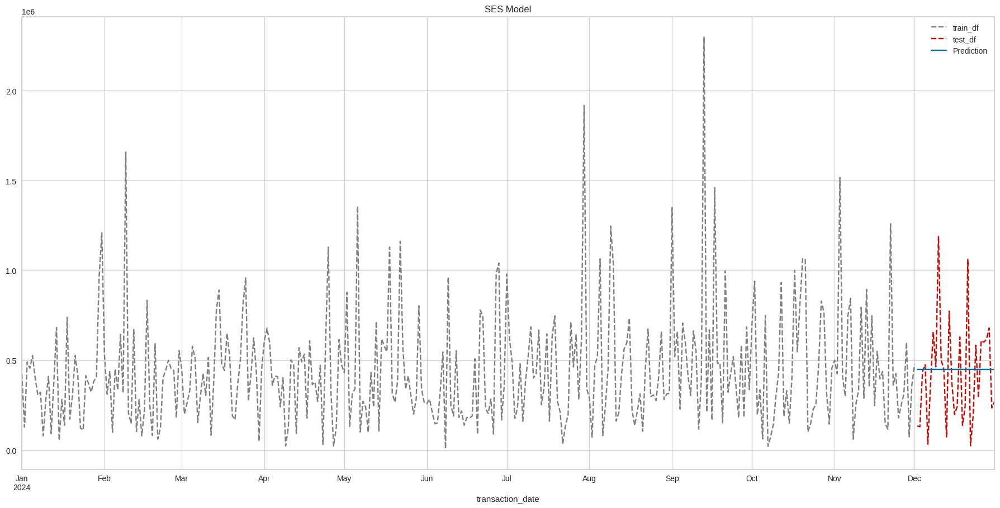

In [ ]:
train_data_4['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_4['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
single_exp_test_pred_4.plot(color='b', legend=True, label='Prediction', title='SES Model')

#### Double Exponential Smoothing

In [ ]:
double_exp_4 = ExponentialSmoothing(train_data_4, trend=None, initialization_method='heuristic', seasonal='add', seasonal_periods=29, damped_trend=False).fit()
double_exp_train_pred_4 = double_exp_4.fittedvalues
double_exp_test_pred_4 = double_exp_4.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


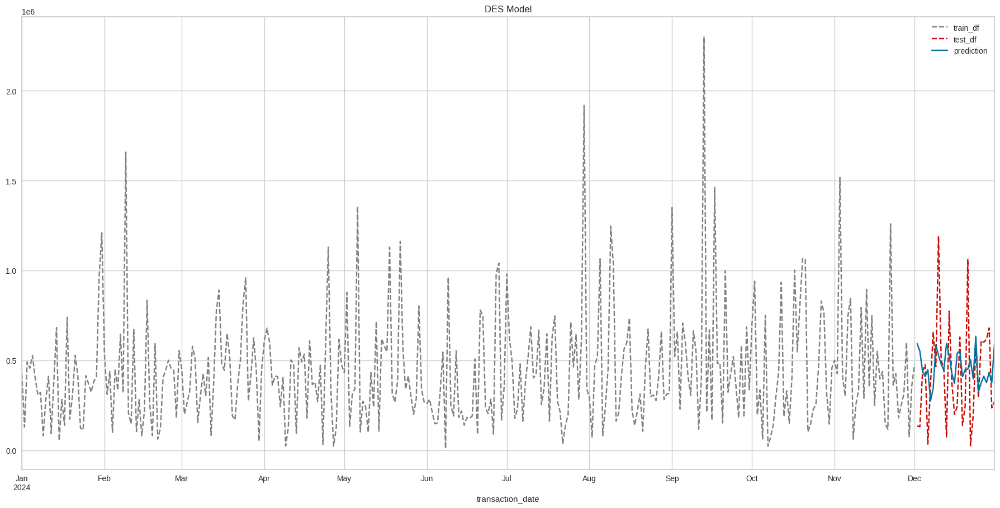

In [ ]:
train_data_4['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_4['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
double_exp_test_pred_4.plot(color='b', legend=True, label='prediction', title='DES Model')
plt.show()

#### Triple Exponential Smoothing

In [ ]:
hw_model_4 = ExponentialSmoothing(train_data_4['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
hw_train_pred_4 =  hw_model_4.fittedvalues
hw_test_pred_4 =  hw_model_4.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


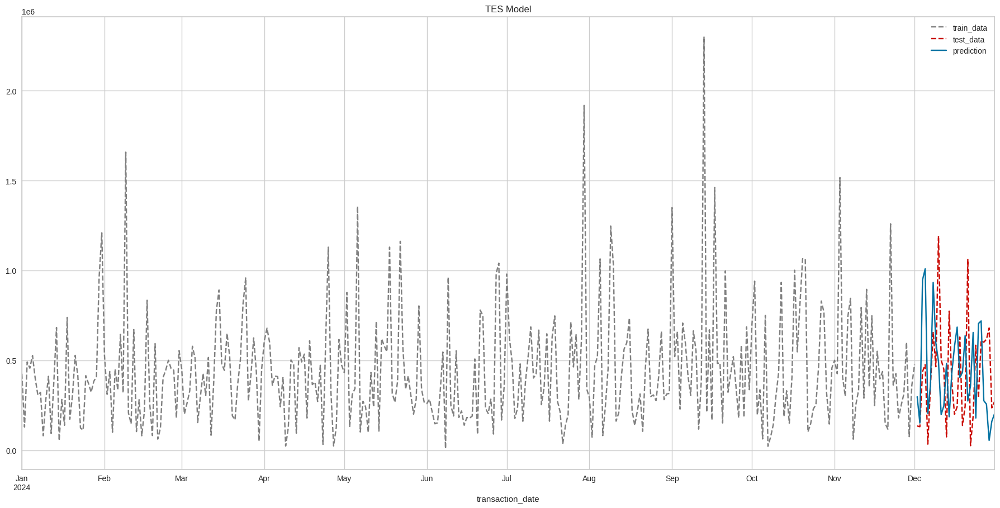

In [ ]:
train_data_4['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_4['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
hw_test_pred_4.plot(color='b', legend=True, label='prediction', title='TES Model')
plt.show()

#### ARIMA

In [ ]:
arima_4 = ARIMA(train_data_4['gross_amount'], order=(13,0,13)).fit()
arima_train_pred_4 = arima_4.predict()
arima_test_pred_4 = arima_4.forecast(30)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using

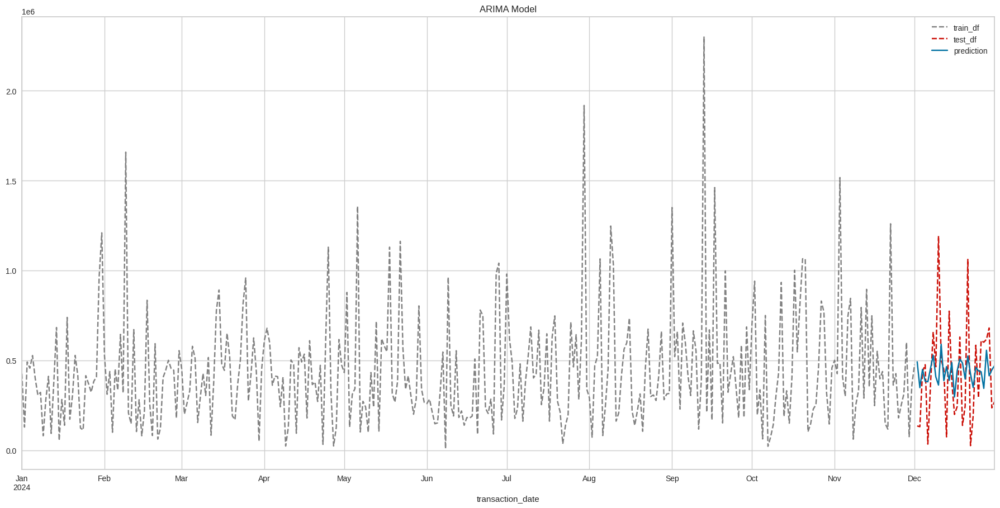

In [ ]:
train_data_4['gross_amount'].plot(style='--', color='gray', legend=True, label='train_df')
test_data_4['gross_amount'].plot(style='--', color='r', legend=True, label='test_df')
arima_test_pred_4.plot(color='b', legend=True, label='prediction', title='ARIMA Model')
plt.show()

#### Final Model Forecast Papua Tengah

In [ ]:
final_model_4 = ExponentialSmoothing(train_data_4['gross_amount'],
                          trend    ='add',
                          initialization_method='heuristic',
                          seasonal = "add",
                          seasonal_periods=160,
                          damped_trend=True).fit()
final_train_pred_4 =  final_model_4.fittedvalues
final_test_pred_4 =  final_model_4.forecast(60)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/holtwinters/model.py:918: ConvergenceWarning: Optimization failed to converge. Check mle_retvals.
  warnings.warn(


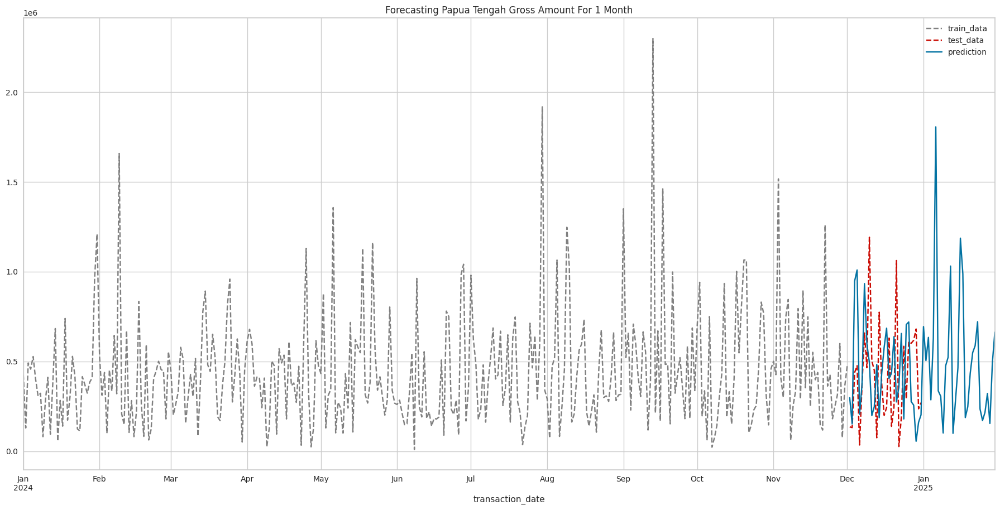

In [ ]:
train_data_4['gross_amount'].plot(style='--', color='gray', legend=True, label='train_data')
test_data_4['gross_amount'].plot(style='--', color='r', legend=True, label='test_data')
final_test_pred_4.plot(color='b', legend=True, label='prediction', title='Forecasting Papua Tengah Gross Amount For 1 Month')
plt.show()

## Clustering

### Feature Engineering

Disini kita akan melakukan feature engineering terhadap kolom gross_amount, discounts, dan user_id dikarenakan pada clustering dataset level dan user-location akan kita pakai sebagai df utama untuk modeling, dan untuk menghindari duplikat terhadap user, yang disebabkan oleh permasalahan dimana satu user dapat memiliki beberapa transaksi dalam level, aggregrasi terhadap user itu sendiri akan cukup untuk mengatasinya.

In [ ]:
aggregated_transaction_df = level_merged.groupby('user_id').agg(
  total_gross_amount=pd.NamedAgg(column='gross_amount', aggfunc='sum'),
  total_discounts=pd.NamedAgg(column='discounts', aggfunc='sum'),
  transaction_count=pd.NamedAgg(column='user_id', aggfunc='count')
).reset_index()

In [ ]:
df_cluster = pd.merge(user_location_merged, aggregated_transaction_df, left_on='id', right_on='user_id', how='left')

df_cluster.drop('user_id', axis=1, inplace=True)

Data collecting pada tahapan model clustering.

In [ ]:
df_cluster.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 76155 entries, 0 to 76154
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   id                  76155 non-null  object        
 1   full_name           76155 non-null  object        
 2   gender              76155 non-null  object        
 3   money_spent         76155 non-null  float64       
 4   refund              76155 non-null  float64       
 5   wallet_balance      76155 non-null  float64       
 6   join_date           76155 non-null  datetime64[ns]
 7   birth               76155 non-null  datetime64[ns]
 8   nama provinsi       76155 non-null  object        
 9   kode provinsi       76155 non-null  int64         
 10  nama kabupaten      76155 non-null  object        
 11  kode kabupaten      76155 non-null  object        
 12  nama kecamatan      76155 non-null  object        
 13  age                 76155 non-null  int64     

Terlihat adanya 3 feature baru yaitu, total_gross_amount, total_discounts, dan transaction_count.

In [ ]:
df_cluster.describe(include='object')

,id,full_name,gender,nama provinsi,nama kabupaten,kode kabupaten,nama kecamatan
count,76155,76155,76155,76155,76155,76155,76155
unique,76155,61006,2,4,60,60,851
top,SC7502062007001,SRI,perempuan,JAWA TENGAH,CILACAP,3301,KARANGANYAR
freq,1,261,59628,68535,4643,4643,542


Dari describe diatas, dapat kita simpulkan beberapa informasi singkat.

### Scaling

Tahap selanjutnya kita akan melakukan proses scaling terhadap df_cluster baru kita, yang dimana perbandingan nilai antar kolom memiliki celah perbandingan yang besar, hal ini dilakukan untuk mendistribusikan berat value yang setara terhadap df_cluster, perbandingan perbedaan data yang signifikan ditakutkan akan menghambat performa model nantinya.

In [ ]:
features = [
  'money_spent', 'refund', 'wallet_balance', 'age',
  'total_gross_amount', 'total_discounts', 'transaction_count'
]

df_cluster_num = df_cluster[features]

scaler = StandardScaler()
df_cluster_scaled = scaler.fit_transform(df_cluster_num)

df_cluster_scaled = pd.DataFrame(df_cluster_scaled, columns=features)

Disini kita hanya akan memakai kolom-kolom numerik saja, clustering menurut kami tidak terlalu membutuhkan kolom-kolom lainnya seperti kategorikal dan timedate, dikarenakan model akan menghitung jarak antar data terhadap centroid, ditakutkan nilai dari kategorikal akan membuat perhitungan model tidak begitu kredibel, dan pastinya untuk datetime tidak bisa kita hitung secara matematik terhadap algoritma clustering.

In [ ]:
df_cluster_scaled.head()

,money_spent,refund,wallet_balance,age,total_gross_amount,total_discounts,transaction_count
0,1.31,-0.43,-0.40,0.45,1.24,-0.83,0.47
1,1.60,-0.34,-0.33,-0.21,1.36,-0.81,0.75
2,1.48,-0.69,-1.01,0.26,1.21,-0.08,0.47
3,1.43,-0.26,-0.79,-1.72,1.21,-0.36,1.04
4,2.05,-1.12,-1.01,-1.72,1.84,-0.38,1.33


Berikut merupakan data setelah kita scaled menggunakan StandarScaler().

### Dimensionality Reduction

Selanjutnya kita akan melakukan dimensional reduction terhadap data, dikarenakan kami pikir dataset terlalu complex, dengan hampir 70000 data dengan total 16 kolom, diharapkan proses ini dapat mengurangi kompleksitas data, supaya model dapat bekerja dengan lebih efisien lagi.

In [ ]:
pca = PCA(n_components=3)
df_cluster_pca = pca.fit_transform(df_cluster_scaled)

df_cluster_pca = pd.DataFrame(df_cluster_pca, columns=['PC1', 'PC2', 'PC3'])

df_cluster_pca.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,76155.00,0.00,1.44,-12.04,-0.88,0.08,0.99,57.67
PC2,76155.00,0.00,1.24,-4.39,-0.85,-0.04,0.77,23.30
PC3,76155.00,0.00,1.00,-1.90,-0.73,-0.02,0.68,2.95


Hasil data setelah melakukan PCA.

<ipython-input-173-aa7aac1c6c89>:4: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  scatter = ax.scatter(df_cluster_pca['PC1'], df_cluster_pca['PC2'], df_cluster_pca['PC3'],


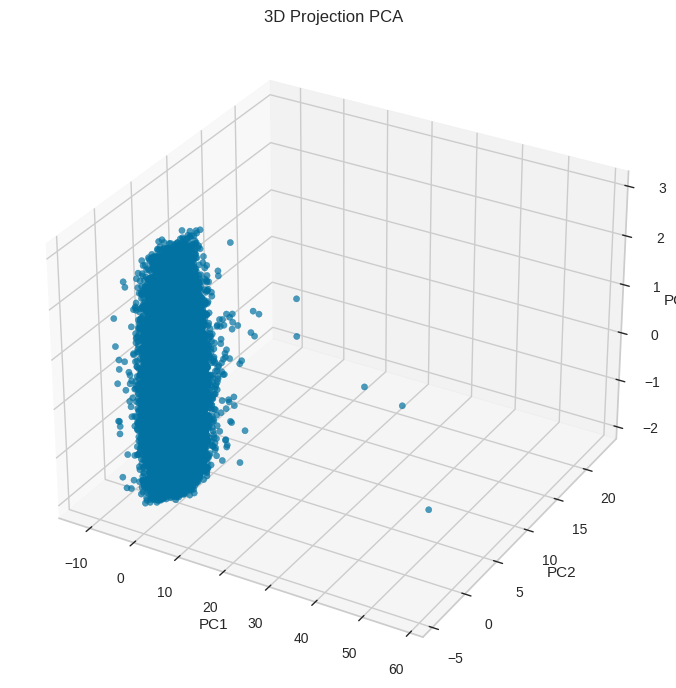

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df_cluster_pca['PC1'], df_cluster_pca['PC2'], df_cluster_pca['PC3'],
                     cmap='viridis', alpha=0.7)

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('3D Projection PCA')

plt.show()

Hasil proyeksi data setelah proses scaling dan dimensionality reduction.

### Modeling

Tahap selanjutnya adalah modeling itu sendiri, disini kami akan memakai metode K-Means terhadap data, dikarenakan df_cluster disini merupakan multivariate data, terlihat dari hasil proyeksi data sebelumnya. Juga efisiensi terhadap waktu dan sumber daya, dan kami memilik hipotesis pasti terhadap clusters yang akan digunakan.

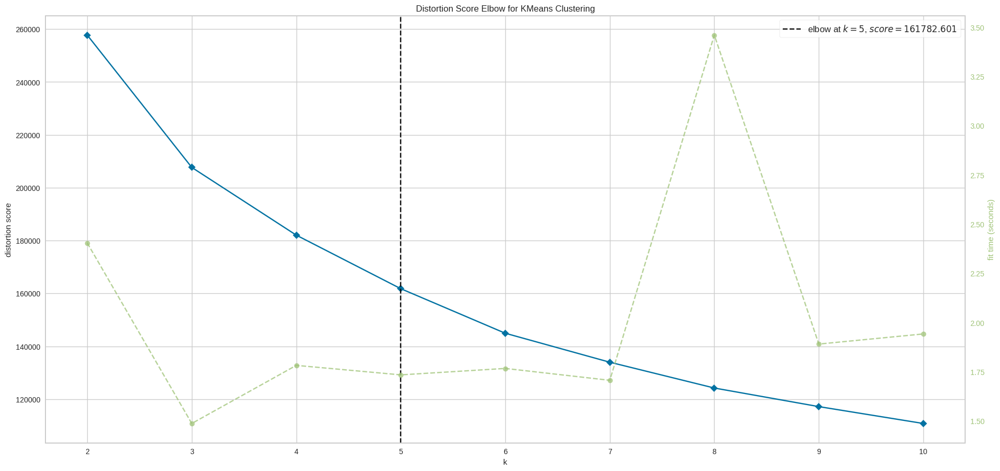

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
Elbow_M = KElbowVisualizer(KMeans(n_init=10), k=10)
Elbow_M.fit(df_cluster_pca)

Elbow_M.show()

Berdasarkan perhitungan KElbowVisualizer, dengan jumlah k=10, dilakukan pengecekan optimisasi cluster menggunakan Distortion Score Elbow terhadap data, dan didapat bahwa k = 5 merupakan jumlah cluster yang paling optimal dengan score yang telah tercantum.

In [ ]:
k=5

kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
kmeans_clusters = kmeans.fit_predict(df_cluster_pca.iloc[:, :-1])

df_cluster_pca['kmeans_cluster'] = kmeans_clusters
df_cluster['kmeans_cluster'] = kmeans_clusters

Disini kita fit model terhadap data, dengan parameter k = 5, max_iter = 300, n_init = 10, dan dengan random_state = 42, supaya data tidak terlalu random setiap ada pengulangan kode.

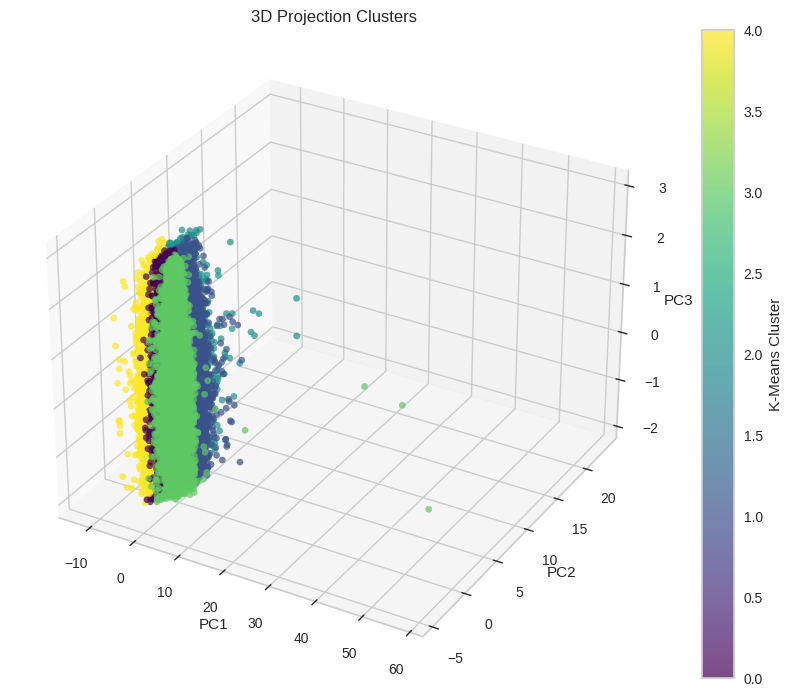

In [ ]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(df_cluster_pca['PC1'], df_cluster_pca['PC2'], df_cluster_pca['PC3'],
                     c=df_cluster_pca['kmeans_cluster'], cmap='viridis', alpha=0.7)

colorbar = plt.colorbar(scatter)
colorbar.set_label('K-Means Cluster')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.set_title('3D Projection Clusters')

plt.show()

Didapat clusters sudah terlihat ketika kita visualisasikan.

In [ ]:
silhouette_kmeans = silhouette_score(df_cluster_pca, kmeans_clusters)

print(f"K-Means Silhouette Score: {silhouette_kmeans}")

K-Means Silhouette Score: 0.38020511040936567


Disini model clustering mendapatkan performa yang cukup bagus, dengan nilai Silhouette Score mencapai positif 0.38, lumayan jauh dari 0 dan mendekati positif 1. Hal ini bermaksud bahwa jarak data didalam cluster terhitung dengan cukup baik, dimana nilai-nilai data didalam suatu cluster cenderung dekat dengan centroid clusternya sendiri, dibandingkan terhadap cluster dan centroid tetangganya.

### Analisis Hasil

Selanjutnya kita akan menggali beberapa informasi baru yang dapat kita cari setelah clustering.

<ipython-input-178-963b792afd8e>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  pl = sns.countplot(x=df_cluster_pca["kmeans_cluster"], palette= pal)
<ipython-input-178-963b792afd8e>:2: UserWarning: 
The palette list has fewer values (4) than needed (5) and will cycle, which may produce an uninterpretable plot.
  pl = sns.countplot(x=df_cluster_pca["kmeans_cluster"], palette= pal)


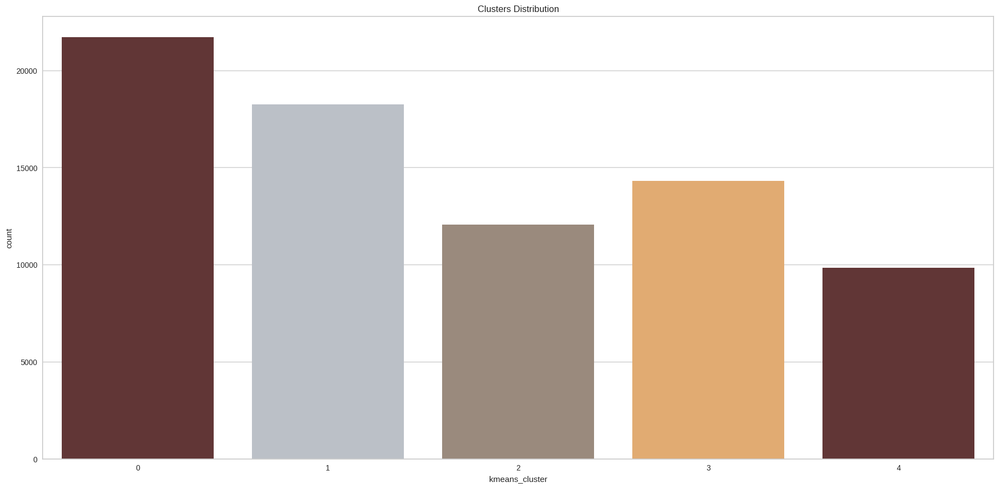

In [ ]:
pal = ["#682F2F","#B9C0C9", "#9F8A78","#F3AB60"]
pl = sns.countplot(x=df_cluster_pca["kmeans_cluster"], palette= pal)
pl.set_title("Clusters Distribution")

plt.show()

Didapat distribusi dari cluster, dimana cluster 0, 1, dan 3 merupakan top 3 dari distribusi data. Yang ini secara insight mungkin dapat diartikan bahwa mayoritas pengguna user terkelompokkan dalam cluster 0, 1 dan 3.

In [ ]:
df_cluster.head()

,id,full_name,gender,money_spent,refund,wallet_balance,join_date,birth,nama provinsi,kode provinsi,nama kabupaten,kode kabupaten,nama kecamatan,age,total_gross_amount,total_discounts,transaction_count,kmeans_cluster
0,SC7502062007001,PRIYANTI FIORI,perempuan,2270000.00,130000.00,480000.00,2023-11-05,1984-07-25,GORONTALO,75,BOALEMO,7502,BOTUMOITO,40,2270000.00,175700.00,34,3
1,SC7502062007002,KURNIA MUHAMAD WANIMBO,laki-laki,2370000.00,140000.00,500000.00,2023-12-27,1991-02-12,GORONTALO,75,BOALEMO,7502,BOTUMOITO,33,2320000.00,179000.00,36,3
2,SC7502062002001,Charlotte NURHALIMAH,perempuan,2330000.00,100000.00,310000.00,2023-12-17,1986-10-21,GORONTALO,75,BOALEMO,7502,BOTUMOITO,38,2260000.00,283400.00,34,3
3,SC7502062002002,Hj. OLVAH,perempuan,2310000.00,150000.00,370000.00,2023-10-21,2007-10-08,GORONTALO,75,BOALEMO,7502,BOTUMOITO,17,2260000.00,244100.00,38,3
4,SC7502062002003,HARAHAP ROHMAN S.Pd.,laki-laki,2530000.00,50000.00,310000.00,2023-10-18,2007-03-27,GORONTALO,75,BOALEMO,7502,BOTUMOITO,17,2510000.00,240000.00,40,3


#### Segmentasi Customer

Disini kami akan menganalisa pola segmentasi customer.

<ipython-input-180-c88bb1a3ca7d>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x="kmeans_cluster", y="money_spent", data=df_cluster, palette="viridis")


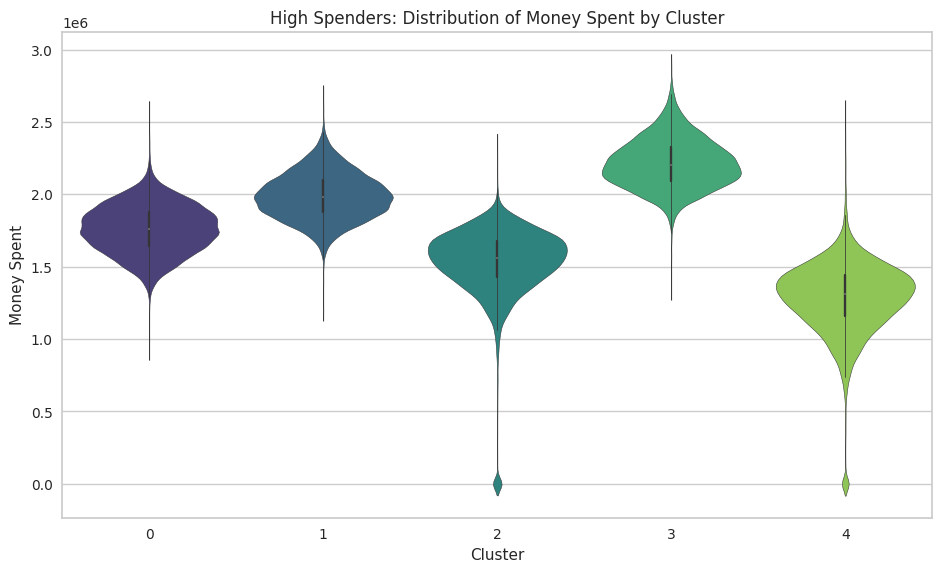

In [ ]:
# Set the style of seaborn plots
sns.set_style("whitegrid")

# 1. High Spenders: Violin plot of money_spent by cluster
plt.figure(figsize=(10, 6))
sns.violinplot(x="kmeans_cluster", y="money_spent", data=df_cluster, palette="viridis")
plt.title("High Spenders: Distribution of Money Spent by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Money Spent")
plt.show()

Disini didapatkan informasi distribusi dari money_spent, bahwa cluster 3 merupakan kelompok user dengan spending terbanyak dari cluster lainnya.

<ipython-input-181-2d317bbff660>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="kmeans_cluster", y="transaction_count", data=df_cluster, estimator='mean', palette="viridis")


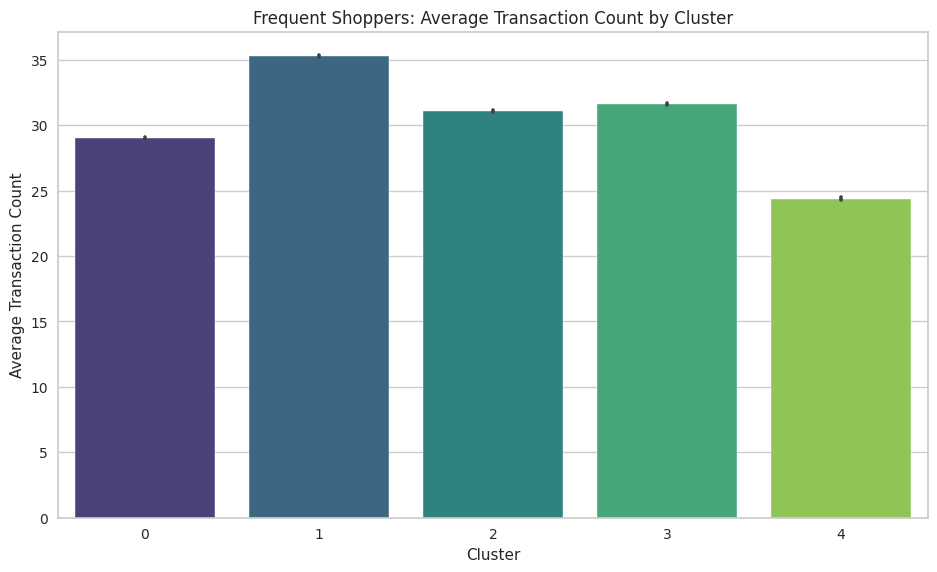

In [ ]:
# 2. Frequent Shoppers: Bar plot of average transaction_count by cluster
plt.figure(figsize=(10, 6))
sns.barplot(x="kmeans_cluster", y="transaction_count", data=df_cluster, estimator='mean', palette="viridis")
plt.title("Frequent Shoppers: Average Transaction Count by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Transaction Count")
plt.show()

Didapatkan juga informasi bahwa user 1, 3, dan 0 merupakan top dari total distribusi transaksi yang terjadi.

<ipython-input-182-a5a2c7373567>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x="kmeans_cluster", y="total_discounts", data=df_cluster, estimator='mean', palette="viridis")


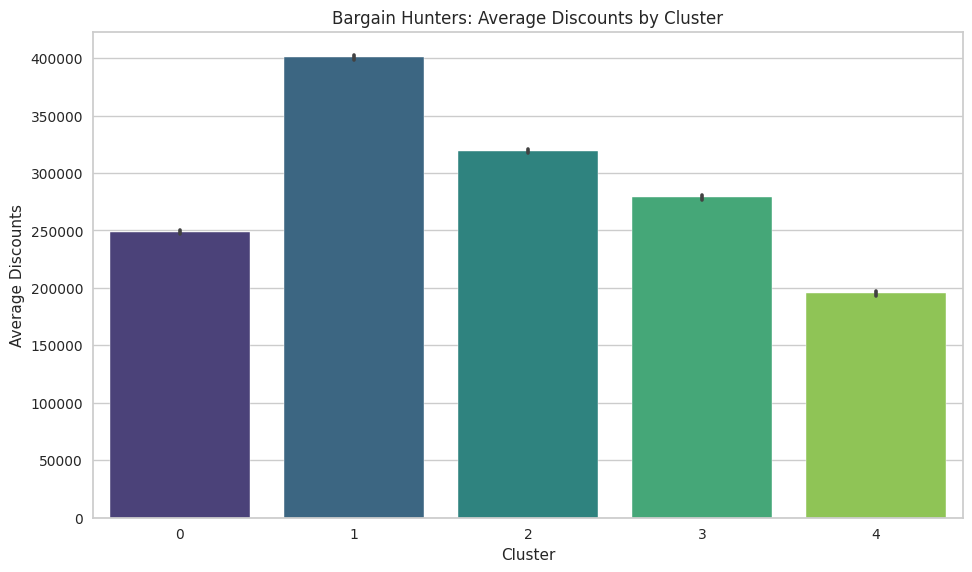

In [ ]:
# 3. Bargain Hunters: Bar plot of average discounts by cluster
plt.figure(figsize=(10, 6))
sns.barplot(x="kmeans_cluster", y="total_discounts", data=df_cluster, estimator='mean', palette="viridis")
plt.title("Bargain Hunters: Average Discounts by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Average Discounts")
plt.show()

Didapatkan juga informasi bahwa user 1, 2 dan 3 merupakan top dari orang-orang yang suka hunting diskon.

#### Segmentasi Demografik

Selanjutnya kami akan menganalisa segmentasi demografik terhadap cluster.

<ipython-input-183-3cfe25731a38>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="kmeans_cluster", y="age", data=df_cluster, palette="viridis")


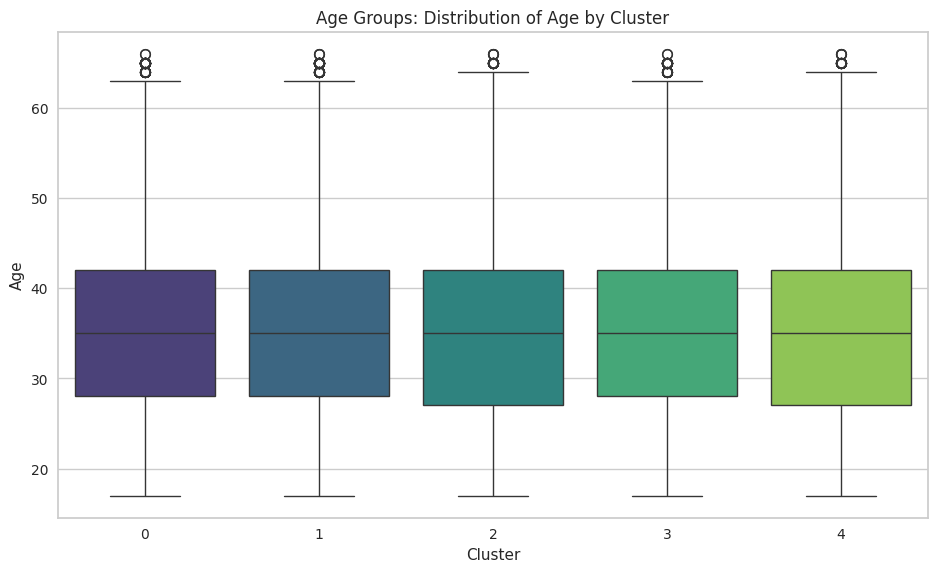

In [ ]:
# 1. Age Groups: Box plot or bar plot of age by cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x="kmeans_cluster", y="age", data=df_cluster, palette="viridis")
plt.title("Age Groups: Distribution of Age by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Age")
plt.show()

Umur 30-40 mendominasi semua distribusi cluster, ini berarti user kita mayoritas merupakan generasi milenial, jika kita hipotesiskan terhadap waktu saat ini.

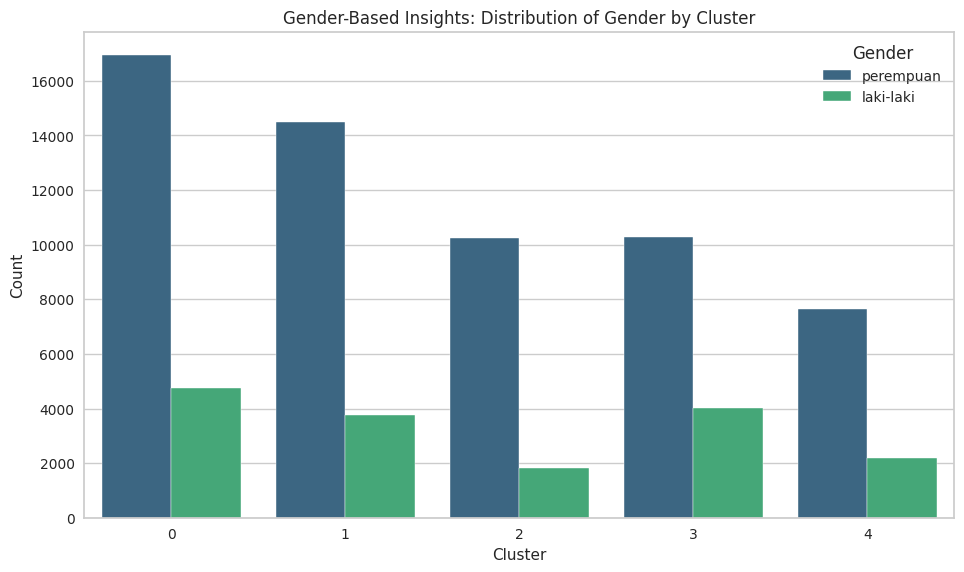

In [ ]:
# 2. Gender-Based Insights: Count plot of gender by cluster
plt.figure(figsize=(10, 6))
sns.countplot(x="kmeans_cluster", hue="gender", data=df_cluster, palette="viridis")
plt.title("Gender-Based Insights: Distribution of Gender by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.legend(title="Gender")
plt.show()

Mayoritas dari distribusi cluster juga merupakan perempuan, mereka mendominasi seluruh cluster.

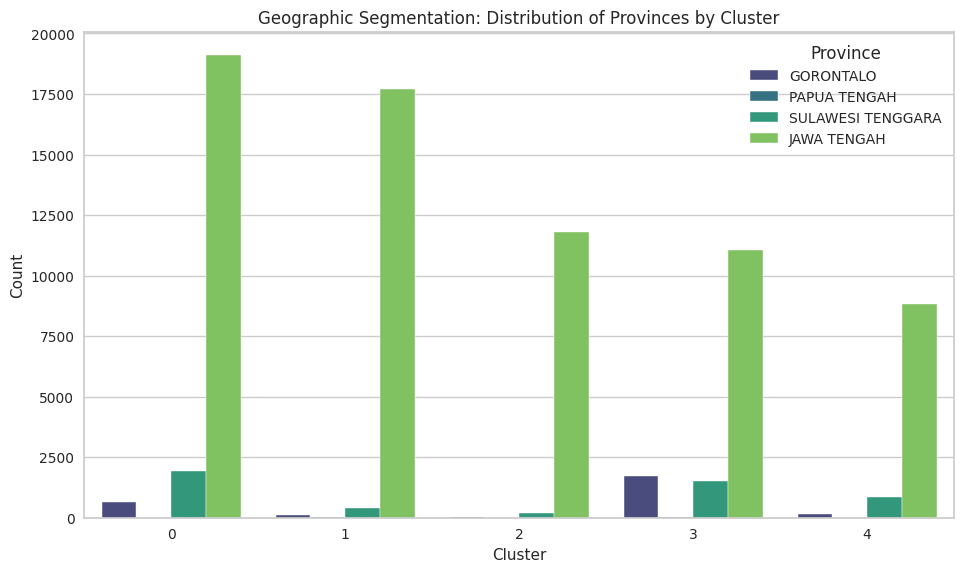

In [ ]:
# 3. Geographic Segmentation: Count plots or bar plots of geographic features by cluster
plt.figure(figsize=(10, 6))
sns.countplot(x="kmeans_cluster", hue="nama provinsi", data=df_cluster, palette="viridis")
plt.title("Geographic Segmentation: Distribution of Provinces by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Count")
plt.legend(title="Province")
plt.show()

Mereka juga mayoritas berasal dari provinsi Jawa Tengah, dan sedikit sekali di provinsi Papua Tengah, ini menarik dikarenakan berdasarkan analisa top user pada section EDA, dikatakan bahwa Papua Tengah memiliki top user dengan transaksi yang cukup signifikan, dapat dilakukan hipotesis bahwa user-user dengan provinsi Papua Tengah, merupakan para relawan atau segelintir orang kaya atau pebisnis di provinsi itu.

#### Financial Behaviours

Selanjutnya kita akan menganalisa pola finansial dari kelompok cluster.

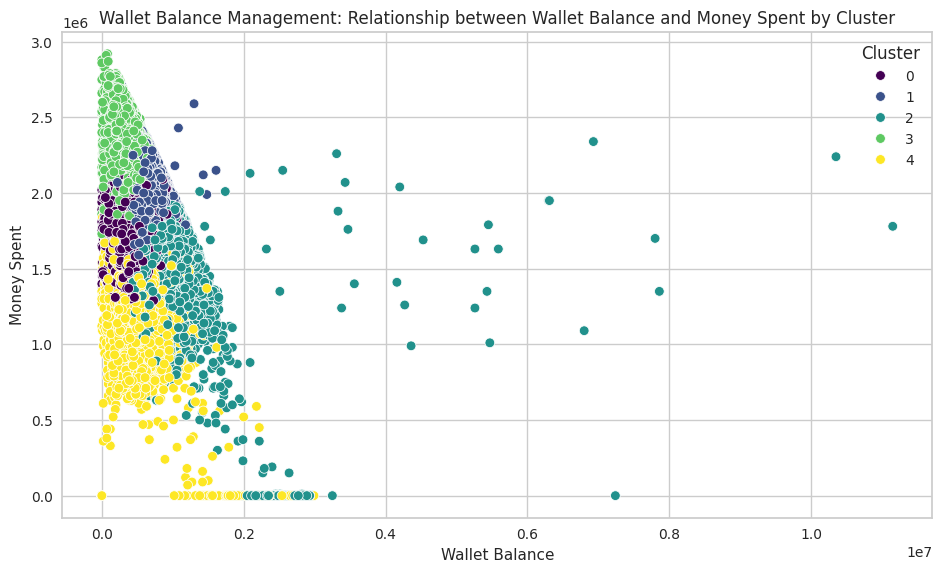

In [ ]:
# 1. Wallet Balance Management: Scatter plot of wallet_balance vs. money_spent by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(x="wallet_balance", y="money_spent", hue="kmeans_cluster", data=df_cluster, palette="viridis")
plt.title("Wallet Balance Management: Relationship between Wallet Balance and Money Spent by Cluster")
plt.xlabel("Wallet Balance")
plt.ylabel("Money Spent")
plt.legend(title="Cluster")
plt.show()

Didapatkan informasi bahwa cluster 2 adalah orang-orang dengan jumlah uang yang banyak, tetapi tidak terlalu banyak melakukan belanja, berbanding terbalik dengan cluster 3, dimana mereka orang-orang dengan uang yang termasuk rendah, tetapi banyak melakukan belanja.

<ipython-input-187-dbe0c750b38e>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="kmeans_cluster", y="refund", data=df_cluster, palette="viridis")


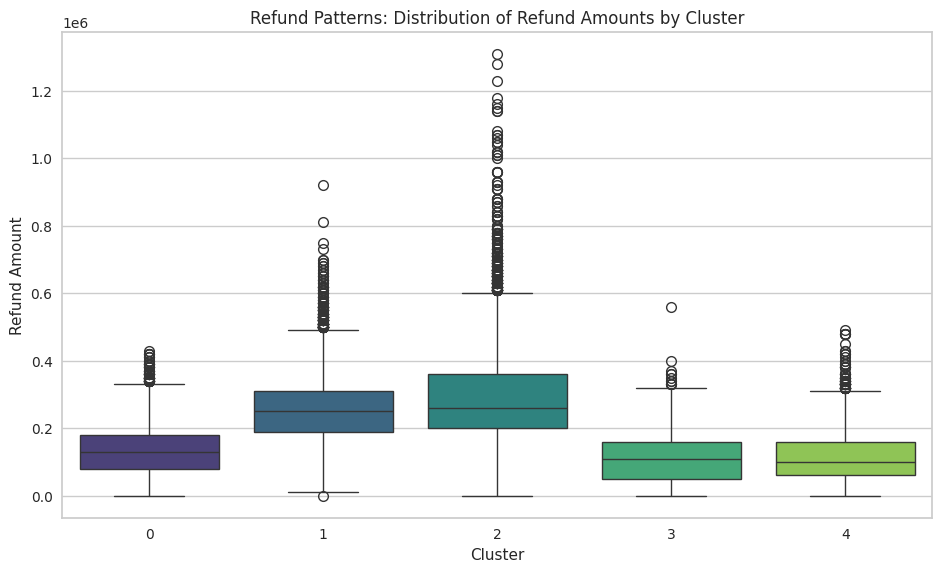

In [ ]:
# 2. Refund Patterns: Box plot or bar plot of refund by cluster
plt.figure(figsize=(10, 6))
sns.boxplot(x="kmeans_cluster", y="refund", data=df_cluster, palette="viridis")
plt.title("Refund Patterns: Distribution of Refund Amounts by Cluster")
plt.xlabel("Cluster")
plt.ylabel("Refund Amount")
plt.show()

Disini kita mendapatkan informasi terhadap distribusi refund terhadap cluster, dimana cluster 2 merupakan orang-orang dengan total_refund tertinggi diantara cluster lainnya.

#### User Engagements

Selanjutnya kita akan menganalisa user engagements berdasarkan cluster.

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:854: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  func(*plot_args, **plot_kwargs)


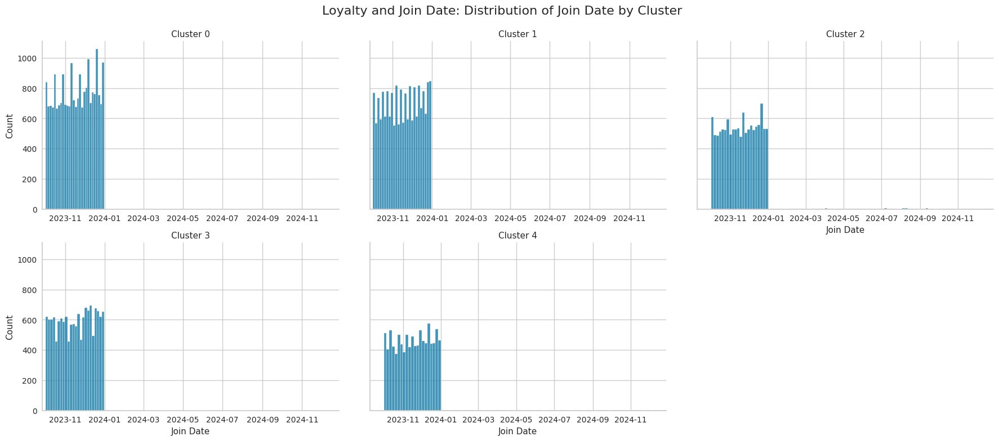

In [ ]:
# 1. Loyalty and Join Date: Histogram or line plot of join date by cluster

g = sns.FacetGrid(df_cluster, col="kmeans_cluster", col_wrap=3, height=4, aspect=1.5, sharex=False)
g.map_dataframe(sns.histplot, x="join_date", palette="viridis", legend=False)
g.set_titles("Cluster {col_name}")
g.set_axis_labels("Join Date", "Count")

max_join_date = df_cluster['join_date'].max()
g.set(xlim=(None, max_join_date))

plt.subplots_adjust(top=0.9)
g.fig.suptitle("Loyalty and Join Date: Distribution of Join Date by Cluster", fontsize=16)

plt.show()

Cluster 0 merupakan cluster dengan pertumbuhan terbanyak dibandingkan cluster lainnya, dengan cluster 4 merupakan cluster dengan pertumbuhan paling rendah diantara cluster lainnya.

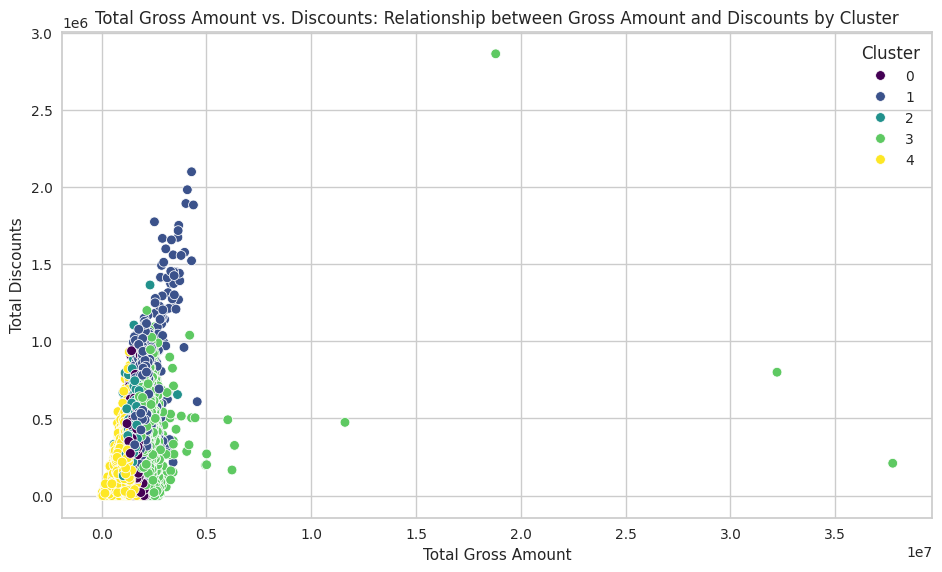

In [ ]:
# 2. Total Gross Amount vs. Discounts: Scatter plot of total_gross_amount vs. total_discounts by cluster
plt.figure(figsize=(10, 6))
sns.scatterplot(x="total_gross_amount", y="total_discounts", hue="kmeans_cluster", data=df_cluster, palette="viridis")
plt.title("Total Gross Amount vs. Discounts: Relationship between Gross Amount and Discounts by Cluster")
plt.xlabel("Total Gross Amount")
plt.ylabel("Total Discounts")
plt.legend(title="Cluster")
plt.show()

Disini juga didapatkan informasi relasi antara total pendapatan dengan diskon, berdasarkan distribusi cluster. Cluster 1 merupakan cluster yang paling terpengaruh oleh diskon.

### Profiling

Cluster 0: Pengadopsi Awal dengan Pengeluaran Moderat
**Karakteristik:**
- **Ukuran Klaster:** Terbesar
- **Perilaku Pengeluaran:** Pengeluaran moderat, peringkat 3 dalam pengeluaran tertinggi
- **Frekuensi Belanja:** Jarang belanja, peringkat 4
- **Sensitivitas terhadap Diskon:** Paling tidak tertarik dengan diskon, peringkat 4
- **Saldo Dompet:** Saldo rendah hingga rata-rata tetapi pengeluaran relatif tinggi
- **Pola Pengembalian:** Pengembalian moderat, peringkat 3
- **Perilaku Diskon:** Keterkaitan rata-rata dengan diskon dan jumlah total bruto rata-rata

**Profil:**
Grup ini terdiri dari sejumlah besar pengadopsi awal yang memiliki pola pengeluaran moderat. Mereka tidak sering berbelanja dan tidak terlalu didorong oleh diskon. Mereka cenderung mempertahankan saldo dompet yang rendah hingga rata-rata tetapi tetap mengeluarkan lebih banyak dari yang diharapkan. Keterlibatan mereka dengan diskon adalah rata-rata, dan mereka memberikan kontribusi signifikan terhadap pendapatan bruto total.

Cluster 1: Pengeluaran Tinggi dan Pemburu Diskon yang Sering
**Karakteristik:**
- **Ukuran Klaster:** Kedua terbesar
- **Perilaku Pengeluaran:** Pengeluaran tinggi, peringkat 2
- **Frekuensi Belanja:** Paling sering berbelanja, peringkat 1
- **Sensitivitas terhadap Diskon:** Paling tertarik dengan diskon, peringkat 1
- **Saldo Dompet:** Saldo rata-rata hingga tinggi dan pengeluaran tinggi
- **Pola Pengembalian:** Pengembalian tinggi, peringkat 2
- **Perilaku Diskon:** Mendominasi area diskon tinggi dan memiliki jumlah total bruto yang tinggi

**Profil:**
Klaster ini dicirikan oleh pelanggan yang sering berbelanja dan sangat tertarik menemukan diskon. Mereka memiliki saldo dompet yang tinggi dan mengeluarkan uang secara signifikan, berkontribusi besar terhadap jumlah bruto total. Mereka juga cenderung sering meminta pengembalian dana. Grup ini sangat aktif dan responsif terhadap promosi diskon.

Cluster 2: Penabung dengan Saldo Tinggi dan Pengembalian yang Sering
**Karakteristik:**
- **Ukuran Klaster:** Keempat terbesar
- **Perilaku Pengeluaran:** Pengeluaran terendah, peringkat 5
- **Frekuensi Belanja:** Cukup sering berbelanja, peringkat 3
- **Sensitivitas terhadap Diskon:** Cukup tertarik dengan diskon, peringkat 2
- **Saldo Dompet:** Saldo tinggi tetapi pengeluaran rendah
- **Pola Pengembalian:** Pengembalian tertinggi, peringkat 1
- **Perilaku Diskon:** Keterkaitan rata-rata dengan diskon dan jumlah total bruto rata-rata

**Profil:**
Pelanggan dalam klaster ini terkenal karena mempertahankan saldo dompet yang tinggi sementara pengeluaran rendah. Mereka cukup sering berbelanja dan mencari diskon serta memiliki tingkat pengembalian tertinggi. Mereka terlibat dengan diskon pada tingkat rata-rata dan memberikan kontribusi moderat terhadap pendapatan bruto.

Cluster 3: Pengeluaran Tinggi dengan Saldo Dompet Rendah
**Karakteristik:**
- **Ukuran Klaster:** Ketiga terbesar
- **Perilaku Pengeluaran:** Pengeluaran tertinggi, peringkat 1
- **Frekuensi Belanja:** Sering berbelanja, peringkat 2
- **Sensitivitas terhadap Diskon:** Cukup tertarik dengan diskon, peringkat 3
- **Saldo Dompet:** Saldo rendah tetapi pengeluaran sangat tinggi
- **Pola Pengembalian:** Pengembalian terendah, peringkat 5
- **Perilaku Diskon:** Keterkaitan rata-rata dengan diskon tetapi jumlah total bruto tertinggi

**Profil:**
Grup ini termasuk dalam pengeluaran tinggi yang sering kali memiliki saldo dompet rendah. Mereka sering berbelanja dan memberikan kontribusi terbesar terhadap pendapatan bruto total meskipun saldo mereka rendah. Mereka memiliki tingkat pengembalian terendah dan cukup tertarik dengan diskon. Pengeluaran tinggi mereka menjadikan mereka penting untuk pendapatan.

Cluster 4: Pembelanja Sesekali dengan Pengeluaran Seimbang
**Karakteristik:**
- **Ukuran Klaster:** Terkecil
- **Perilaku Pengeluaran:** Pengeluaran moderat hingga rendah, peringkat 4
- **Frekuensi Belanja:** Paling jarang berbelanja, peringkat 5
- **Sensitivitas terhadap Diskon:** Paling tidak tertarik dengan diskon, peringkat 5
- **Saldo Dompet:** Saldo rata-rata hingga tinggi dan pengeluaran rata-rata hingga rendah
- **Pola Pengembalian:** Pengembalian rendah, peringkat 4
- **Perilaku Diskon:** Keterkaitan rendah dengan diskon dan jumlah total bruto rendah

**Profil:**
Klaster terkecil ini terdiri dari pelanggan yang berbelanja sesekali dan mengeluarkan jumlah yang moderat hingga rendah. Mereka adalah pembeli paling jarang dan menunjukkan sedikit minat pada diskon. Mereka mempertahankan saldo dompet yang rata-rata hingga tinggi dan cenderung mengeluarkan lebih sedikit, memberikan kontribusi terkecil terhadap jumlah bruto total. Mereka memiliki tingkat pengembalian rendah dan kurang terlibat dengan promosi diskon.

Ringkasan Profil Pelanggan
1. **Pengadopsi Awal dengan Pengeluaran Moderat:** Grup terbesar, pengadopsi awal, pengeluaran moderat, jarang berbelanja.
2. **Pengeluaran Tinggi dan Pemburu Diskon yang Sering:** Pengeluaran tinggi, sering berbelanja, tertarik dengan diskon, pengembalian tinggi.
3. **Penabung dengan Saldo Tinggi dan Pengembalian yang Sering:** Saldo tinggi, pengeluaran rendah, pengembalian sering, cukup tertarik dengan diskon.
4. **Pengeluaran Tinggi dengan Saldo Dompet Rendah:** Pengeluaran tinggi, saldo rendah, sering berbelanja, pengembalian rendah.
5. **Pembelanja Sesekali dengan Pengeluaran Seimbang:** Grup terkecil, paling jarang berbelanja, pengeluaran moderat hingga rendah, tidak tertarik dengan diskon.

# Evaluation

## Forecasting

### Jawa Tengah

#### RMSE

In [ ]:
print('Test RMSE SES Jawa Tengah:',mean_squared_error(test_data, single_exp_test_pred_1)**0.5)
print('Test RMSE DES Jawa Tengah:',mean_squared_error(test_data, double_exp_test_pred_1)**0.5)
print('Test RMSE TES Jawa Tengah:',mean_squared_error(test_data, hw_test_pred_1)**0.5)
print('Test RMSE ARM Jawa Tengah:',mean_squared_error(test_data, arima_test_pred_1)**0.5)

Test RMSE SES Jawa Tengah: 13748879.66055037
Test RMSE DES Jawa Tengah: 12310850.451358149
Test RMSE TES Jawa Tengah: 12111928.854839645
Test RMSE ARM Jawa Tengah: 7183591.909792588


#### MAE

In [ ]:
print('Test MAE SES Jawa Tengah:',mean_absolute_error(test_data, single_exp_test_pred_1))
print('Test MAE DES Jawa Tengah:',mean_absolute_error(test_data, double_exp_test_pred_1))
print('Test MAE TES Jawa Tengah:',mean_absolute_error(test_data, hw_test_pred_1))
print('Test MAE ARM Jawa Tengah:',mean_absolute_error(test_data, arima_test_pred_1))

Test MAE SES Jawa Tengah: 11915450.463046154
Test MAE DES Jawa Tengah: 10302436.678130962
Test MAE TES Jawa Tengah: 9502550.427188413
Test MAE ARM Jawa Tengah: 6294262.059413457


#### MAPE

In [ ]:
print('Test MAPE SES Jawa Tengah:',mean_absolute_percentage_error(test_data, single_exp_test_pred_1))
print('Test MAPE DES Jawa Tengah:',mean_absolute_percentage_error(test_data, double_exp_test_pred_1))
print('Test MAPE TES Jawa Tengah:',mean_absolute_percentage_error(test_data, hw_test_pred_1))
print('Test MAPE ARM Jawa Tengah:',mean_absolute_percentage_error(test_data, arima_test_pred_1))

Test MAPE SES Jawa Tengah: 0.036885660402062
Test MAPE DES Jawa Tengah: 0.0319025675087721
Test MAPE TES Jawa Tengah: 0.029325049943719036
Test MAPE ARM Jawa Tengah: 0.019302119971584205


### Sulawesi Tenggara

#### RMSE

In [ ]:
print('Test RMSE SES Sulawesi Tenggara:',mean_squared_error(test_data_2, single_exp_test_pred_2)**0.5)
print('Test RMSE DES Sulawesi Tenggara:',mean_squared_error(test_data_2, double_exp_test_pred_2)**0.5)
print('Test RMSE TES Sulawesi Tenggara:',mean_squared_error(test_data_2, hw_test_pred_2)**0.5)
print('Test RMSE ARM Sulawesi Tenggara:',mean_squared_error(test_data_2, arima_test_pred_2)**0.5)

Test RMSE SES Sulawesi Tenggara: 2699477.3634474683
Test RMSE DES Sulawesi Tenggara: 2595078.8591462756
Test RMSE TES Sulawesi Tenggara: 3730420.7894820403
Test RMSE ARM Sulawesi Tenggara: 2645308.547932887


#### MAE

In [ ]:
print('Test MAE SES Sulawesi Tenggara:',mean_absolute_error(test_data_2, single_exp_test_pred_2))
print('Test MAE DES Sulawesi Tenggara:',mean_absolute_error(test_data_2, double_exp_test_pred_2))
print('Test MAE TES Sulawesi Tenggara:',mean_absolute_error(test_data_2, hw_test_pred_2))
print('Test MAE ARM Sulawesi Tenggara:',mean_absolute_error(test_data_2, arima_test_pred_2))

Test MAE SES Sulawesi Tenggara: 2059040.3903987124
Test MAE DES Sulawesi Tenggara: 1989402.0310022915
Test MAE TES Sulawesi Tenggara: 2852310.0733656054
Test MAE ARM Sulawesi Tenggara: 2173452.9509439315


#### MAPE

In [ ]:
print('Test MAPE SES Sulawesi Tenggara:',mean_absolute_percentage_error(test_data_2, single_exp_test_pred_2))
print('Test MAPE DES Sulawesi Tenggara:',mean_absolute_percentage_error(test_data_2, double_exp_test_pred_2))
print('Test MAPE TES Sulawesi Tenggara:',mean_absolute_percentage_error(test_data_2, hw_test_pred_2))
print('Test MAPE ARM Sulawesi Tenggara:',mean_absolute_percentage_error(test_data_2, arima_test_pred_2))

Test MAPE SES Sulawesi Tenggara: 0.09123830140952828
Test MAPE DES Sulawesi Tenggara: 0.08846758967791013
Test MAPE TES Sulawesi Tenggara: 0.12509250123253207
Test MAPE ARM Sulawesi Tenggara: 0.09628503247288439


### Gorontalo

#### RMSE

In [ ]:
print('Test RMSE SES Gorontalo:',mean_squared_error(test_data_3, single_exp_test_pred_3)**0.5)
print('Test RMSE DES Gorontalo:',mean_squared_error(test_data_3, double_exp_test_pred_3)**0.5)
print('Test RMSE TES Gorontalo:',mean_squared_error(test_data_3, hw_test_pred_3)**0.5)
print('Test RMSE ARM Gorontalo:',mean_squared_error(test_data_3, arima_test_pred_3)**0.5)

Test RMSE SES Gorontalo: 2028255.4609937
Test RMSE DES Gorontalo: 2238461.173229692
Test RMSE TES Gorontalo: 3024771.1623381097
Test RMSE ARM Gorontalo: 1971240.8972881797


#### MAE

In [ ]:
print('Test MAE SES Gorontalo:',mean_absolute_error(test_data_3, single_exp_test_pred_3))
print('Test MAE DES Gorontalo:',mean_absolute_error(test_data_3, double_exp_test_pred_3))
print('Test MAE TES Gorontalo:',mean_absolute_error(test_data_3, hw_test_pred_3))
print('Test MAE ARM Gorontalo:',mean_absolute_error(test_data_3, arima_test_pred_3))

Test MAE SES Gorontalo: 1655796.5244570887
Test MAE DES Gorontalo: 1856615.4311937948
Test MAE TES Gorontalo: 2423431.5876813876
Test MAE ARM Gorontalo: 1577869.5109683292


#### MAPE

In [ ]:
print('Test MAPE SES Gorontalo:',mean_absolute_percentage_error(test_data_3, single_exp_test_pred_3))
print('Test MAPE DES Gorontalo:',mean_absolute_percentage_error(test_data_3, double_exp_test_pred_3))
print('Test MAPE TES Gorontalo:',mean_absolute_percentage_error(test_data_3, hw_test_pred_3))
print('Test MAPE ARM Gorontalo:',mean_absolute_percentage_error(test_data_3, arima_test_pred_3))

Test MAPE SES Gorontalo: 0.1148544527475879
Test MAPE DES Gorontalo: 0.1260690542291454
Test MAPE TES Gorontalo: 0.16191138898920737
Test MAPE ARM Gorontalo: 0.10771004694281536


### Papua Tengah

#### RMSE

In [ ]:
print('Test RMSE SES Papua Tengah:',mean_squared_error(test_data_4, single_exp_test_pred_4)**0.5)
print('Test RMSE DES Papua Tengah:',mean_squared_error(test_data_4, double_exp_test_pred_4)**0.5)
print('Test RMSE TES Papua Tengah:',mean_squared_error(test_data_4, hw_test_pred_4)**0.5)
print('Test RMSE ARM Papua Tengah:',mean_squared_error(test_data_4, arima_test_pred_4)**0.5)

Test RMSE SES Papua Tengah: 281427.24579924636
Test RMSE DES Papua Tengah: 298687.6633329616
Test RMSE TES Papua Tengah: 382517.62918973627
Test RMSE ARM Papua Tengah: 277926.5135225441


#### MAE

In [ ]:
print('Test MAE SES Papua Tengah:',mean_absolute_error(test_data_4, single_exp_test_pred_4))
print('Test MAE DES Papua Tengah:',mean_absolute_error(test_data_4, double_exp_test_pred_4))
print('Test MAE TES Papua Tengah:',mean_absolute_error(test_data_4, hw_test_pred_4))
print('Test MAE ARM Papua Tengah:',mean_absolute_error(test_data_4, arima_test_pred_4))

Test MAE SES Papua Tengah: 226736.4009953919
Test MAE DES Papua Tengah: 238902.59280445927
Test MAE TES Papua Tengah: 325305.01757249614
Test MAE ARM Papua Tengah: 220680.9928561547


#### MAPE

In [ ]:
print('Test MAPE SES Papua Tengah:',mean_absolute_percentage_error(test_data_4, single_exp_test_pred_4))
print('Test MAPE DES Papua Tengah:',mean_absolute_percentage_error(test_data_4, double_exp_test_pred_4))
print('Test MAPE TES Papua Tengah:',mean_absolute_percentage_error(test_data_4, hw_test_pred_4))
print('Test MAPE ARM Papua Tengah:',mean_absolute_percentage_error(test_data_4, arima_test_pred_4))

Test MAPE SES Papua Tengah: 1.6986672538564025
Test MAPE DES Papua Tengah: 1.8783378210410622
Test MAPE TES Papua Tengah: 1.534317157545105
Test MAPE ARM Papua Tengah: 1.5716309109397077
